In [1]:
import time
import os
import math
import cv2
import numpy as np
import pandas as pd
import pyautogui as pa
import shutil
import imageio
import re  # regex
from PIL import Image, ImageDraw
import random
from scipy.stats import sem, ttest_ind, norm, ttest_ind_from_stats
from scipy.optimize import curve_fit

from lib.analysis.trace_metrics import TraceMetrics
from lib.analysis.false_discovery_control import false_discovery_control
from lib.auto_GUI.auto_PhotoZ import AutoPhotoZ
from lib.analysis.laminar_dist import *
from lib.file.TIF import *
from lib.analysis.align import ImageAlign
from lib.utilities import *
from lib.file.ROI_writer import ROIFileWriter
from lib.file.ROI_reader import ROIFileReader
from lib.analysis.barrel_roi import Barrel_ROI_Creator
from lib.analysis.cell_roi import RandomROISample, OverlapCounterROI
from lib.analysis.baseline_correction import BaselineCorrection

# 2-way ANOVA for medial and lateral PPR vs IPI
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.api as sm

In [2]:
# load trace files from the following directory
data_dir = "C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/"
ppr_coronal_df = data_dir + "export_summary_backup_coronal.csv"
ppr_sagittal_df = data_dir + "export_summary_backup_sagittal.csv"

camera_program = 4
um_per_px = 6.0 #um
output_fig_dir = 'P:/John/crossing-paper/input/'

# load the CSVs
ppr_coronal_df = pd.read_csv(ppr_coronal_df)
ppr_sagittal_df = pd.read_csv(ppr_sagittal_df)

# add column for Coronal/Sagittal
ppr_coronal_df['Section'] = 'Coronal'
ppr_sagittal_df['Section'] = 'Sagittal'

# combine the dataframes
ppr_df = ppr_coronal_df.append(ppr_sagittal_df)

ppr_df

,ROI,amp,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,trace_non_polyfit,amp_array,Medial/Lateral,Section,Rostral/Caudal
0,1,0.479013,120.492,18.61820,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN
1,2,0.330619,120.585,30.66020,44.112853,28.366771,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,Coronal,NaN
2,1,0.176925,182.307,3.53397,51.660221,53.138122,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN
3,2,0.078507,182.489,7.29899,44.112853,28.366771,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,Coronal,NaN
4,1,0.590332,120.014,12.29530,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1213,2,5.388340,142.602,5.38834,24.504732,41.558360,3_rois pulse1,4/16/2025,3,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Rostral
1214,1,5.504880,143.043,5.50488,58.472131,43.518033,3_rois pulse1,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Home
1215,2,7.391860,141.078,7.39186,24.504732,41.558360,3_rois pulse1,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Rostral
1216,1,7.935810,185.029,7.93581,58.472131,43.518033,3_rois pulse2,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Home


In [3]:
# load PPR catalog
ppr_catalog = data_dir + "ppr_catalog_backup-both.csv"
ppr_catalog_df = pd.read_csv(ppr_catalog)

# only keep zda_file, IPI, and is_single_pulse_control columns
ppr_catalog_df = ppr_catalog_df[['zda_file', 'IPI', 'is_single_pulse_control']]

# parse slice, location, and recording numbers from zda_file and store in new columns
ppr_catalog_df['zda_id'] = ppr_catalog_df['zda_file'].apply(lambda x: x.split('/')[-1].split('.')[0])
ppr_catalog_df['Slice'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[0]))
ppr_catalog_df['Location'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[1]))
ppr_catalog_df['Recording'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[2]))

# parse date from zda_file column. It is in format "/mm-dd-yy/", use pattern matching to extract date (regex)
# Function to extract date using regex
def extract_date(filename):
    match = re.search(r'(\d{2}-\d{2}-\d{2})', filename)
    if match:
        # remove zero padding from day and month
        m,d,y = match.group(0).split('-')
        d = str(int(d))
        m = str(int(m))
        return f"{m}/{d}/20{y}"
    return None

ppr_catalog_df['Date'] = ppr_catalog_df['zda_file'].apply(extract_date)
ppr_catalog_df

,zda_file,IPI,is_single_pulse_control,zda_id,Slice,Location,Recording,Date
0,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,60,0,01_03_01,1,3,1,1/2/2025
1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,60,1,01_03_02,1,3,2,1/2/2025
2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,40,1,01_03_03,1,3,3,1/2/2025
3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,40,0,01_03_04,1,3,4,1/2/2025
4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,10,0,01_03_05,1,3,5,1/2/2025
...,...,...,...,...,...,...,...,...
669,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,120,1,03_02_22,3,2,22,4/16/2025
670,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,90,0,03_02_23,3,2,23,4/16/2025
671,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,90,1,03_02_24,3,2,24,4/16/2025
672,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,40,1,03_02_25,3,2,25,4/16/2025


In [4]:
def read_array_file(filename): 
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=None,
                                 names=['Index',  'Values'])
    return np.array(data_arr['Values']).reshape((80, 80))

def read_dat_trace_file(filename):
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=0)  # change me to traces?
    data_arr = data_arr.apply(pd.to_numeric, errors='coerce')
    return data_arr

# merge the two dataframes, using date, slice, location, and recording as keys
ppr_df = ppr_df.merge(ppr_catalog_df, on=['Date', 'Slice', 'Location', 'Recording'])

# drop the zda_file column
ppr_df.drop('zda_file', axis=1, inplace=True)

# drop all IPIs <= 10 ms
ppr_df = ppr_df[ppr_df['IPI'] > 10]

ppr_df

,ROI,amp,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,trace_non_polyfit,amp_array,Medial/Lateral,Section,Rostral/Caudal,IPI,is_single_pulse_control,zda_id
0,1,0.479013,120.492,18.61820,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN,60,0,01_03_01
1,2,0.330619,120.585,30.66020,44.112853,28.366771,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,Coronal,NaN,60,0,01_03_01
2,1,0.176925,182.307,3.53397,51.660221,53.138122,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN,60,0,01_03_01
3,2,0.078507,182.489,7.29899,44.112853,28.366771,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,Coronal,NaN,60,0,01_03_01
4,1,0.590332,120.014,12.29530,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN,60,1,01_03_02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2368,2,5.388340,142.602,5.38834,24.504732,41.558360,3_rois pulse1,4/16/2025,3,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Rostral,40,1,03_02_25
2369,1,5.504880,143.043,5.50488,58.472131,43.518033,3_rois pulse1,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Home,40,0,03_02_26
2370,2,7.391860,141.078,7.39186,24.504732,41.558360,3_rois pulse1,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Rostral,40,0,03_02_26
2371,1,7.935810,185.029,7.93581,58.472131,43.518033,3_rois pulse2,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Home,40,0,03_02_26


 1/2/2025 1_3 IPI 60ms
 1/2/2025 1_3 IPI 40ms
 1/2/2025 1_3 IPI 130ms
 1/2/2025 1_3 IPI 110ms


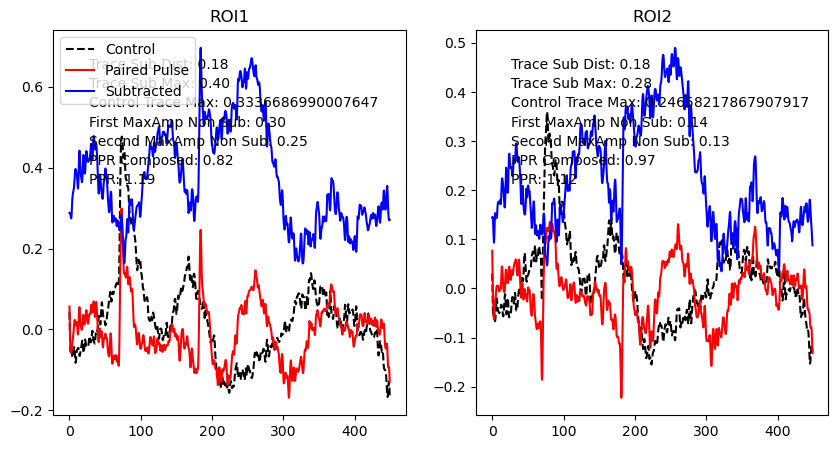

 1/2/2025 1_3 IPI 30ms
 1/2/2025 1_3 IPI 20ms
 1/2/2025 1_3 IPI 120ms
 1/2/2025 1_3 IPI 50ms
 1/2/2025 1_3 IPI 80ms
 1/2/2025 1_3 IPI 100ms
 1/2/2025 1_3 IPI 90ms
 1/2/2025 1_3 IPI 70ms
 1/2/2025 2_2 IPI 110ms


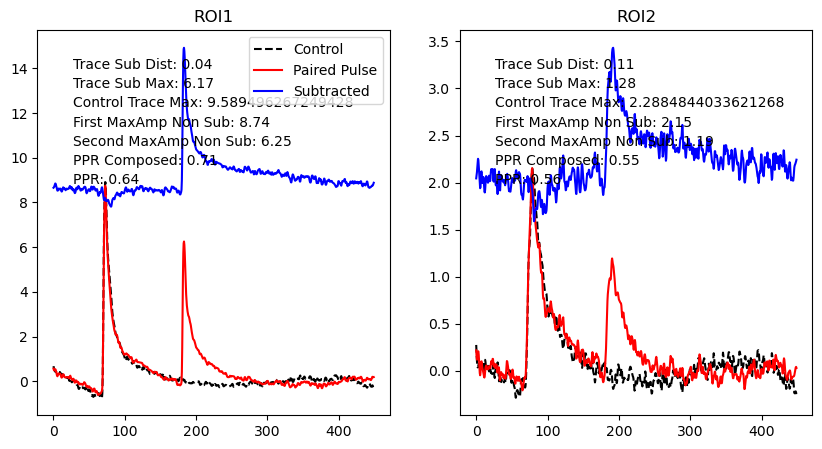

 1/2/2025 2_2 IPI 80ms


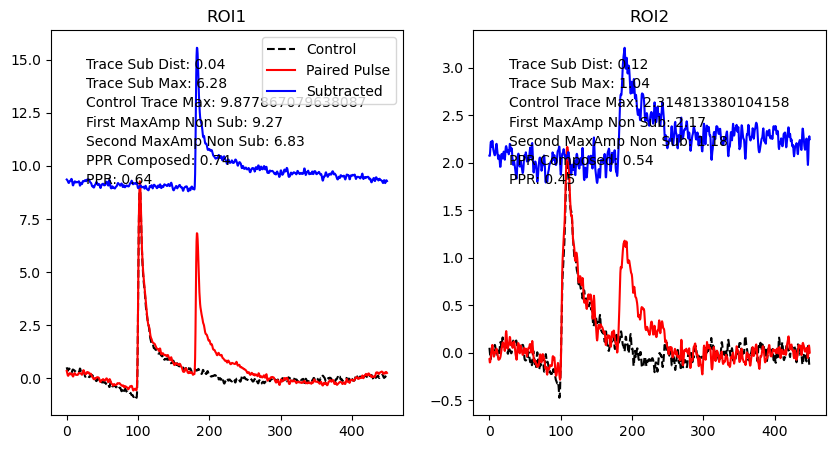

 1/2/2025 2_2 IPI 100ms


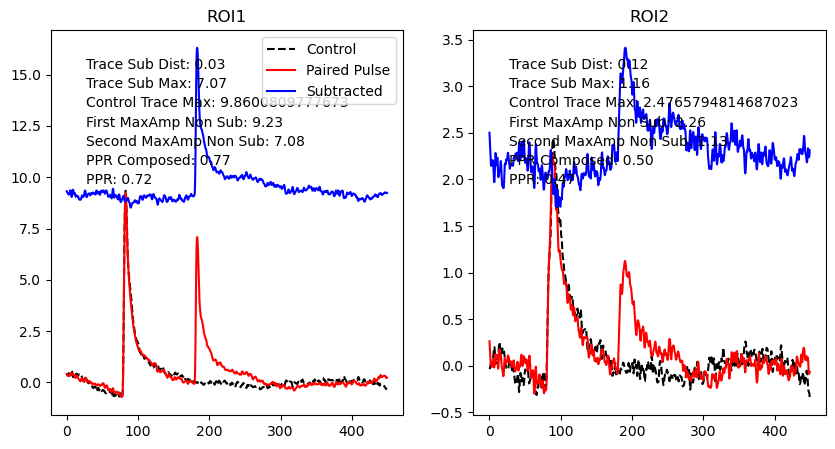

 1/2/2025 2_2 IPI 30ms


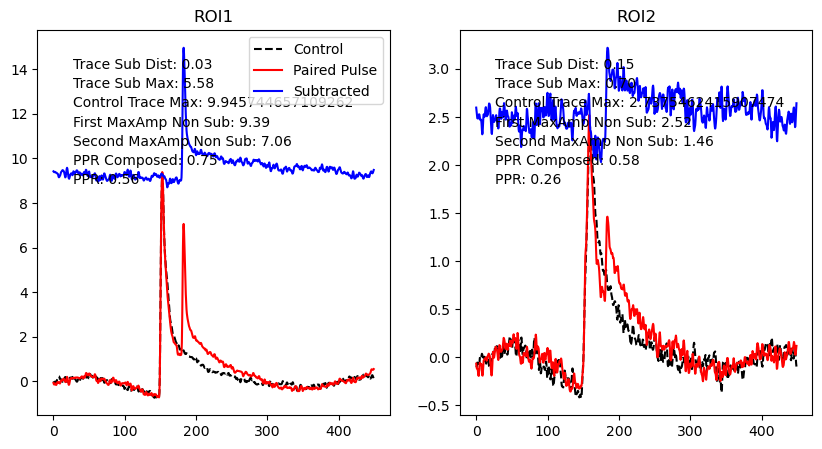

 1/2/2025 2_2 IPI 40ms


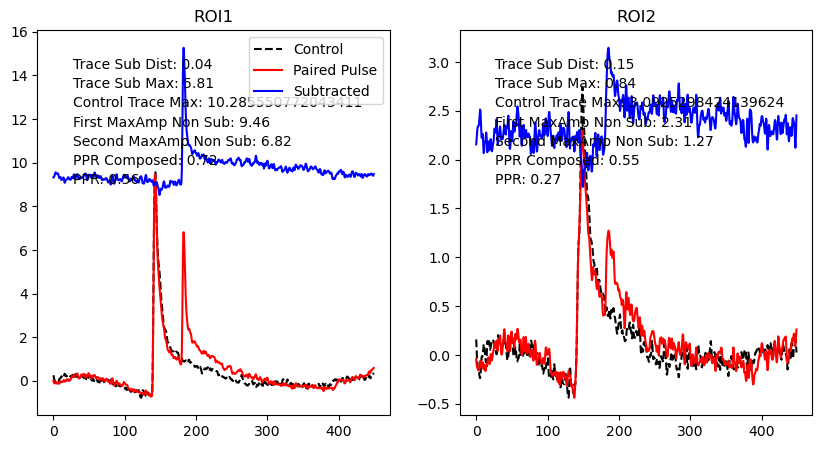

 1/2/2025 2_2 IPI 70ms


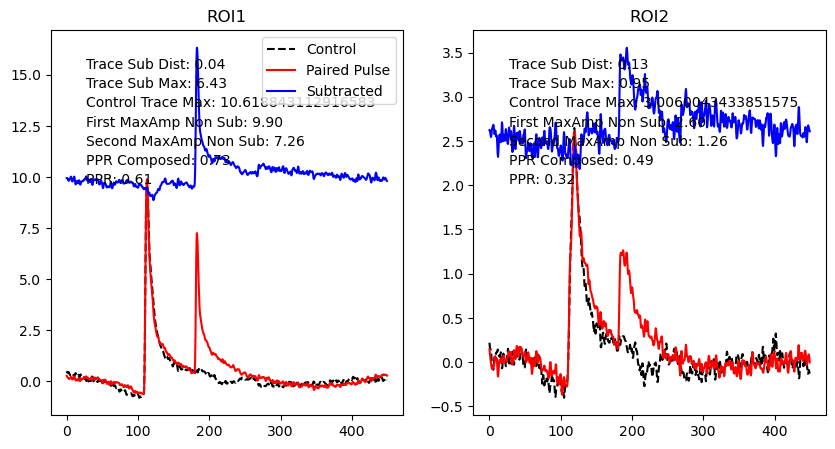

 1/2/2025 2_2 IPI 50ms


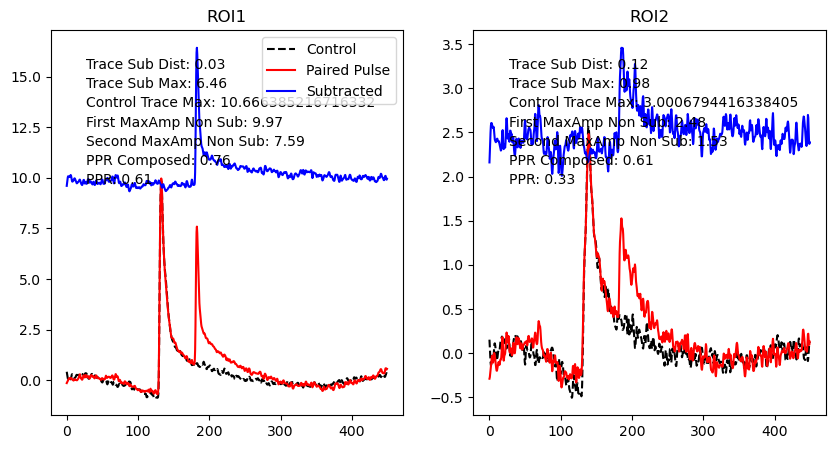

 1/2/2025 2_2 IPI 120ms


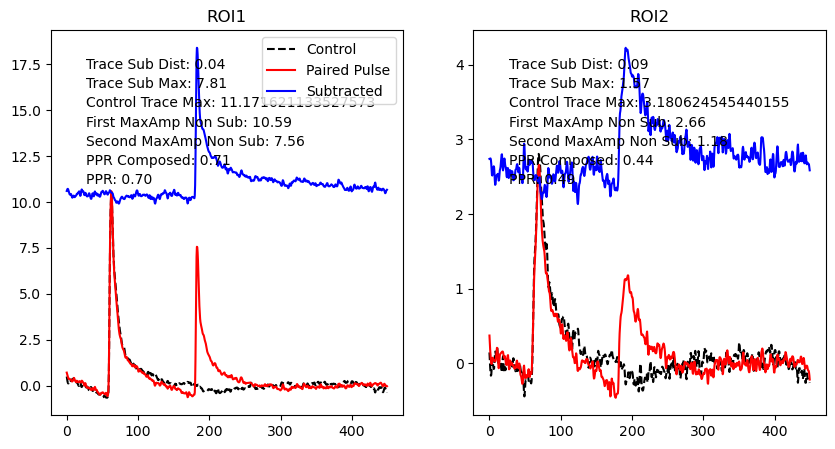

 1/2/2025 2_2 IPI 20ms


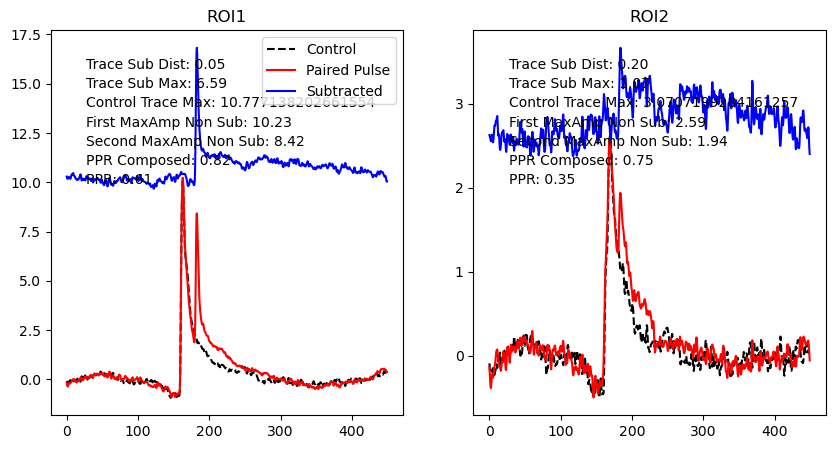

 1/2/2025 2_2 IPI 60ms


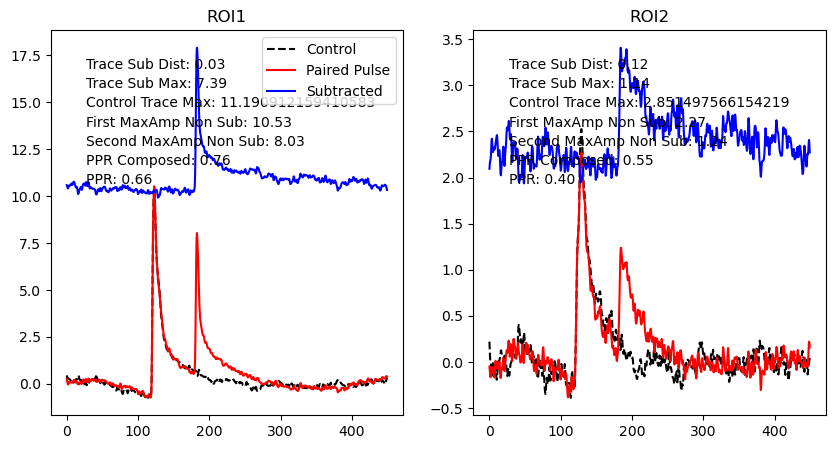

 1/2/2025 2_2 IPI 130ms


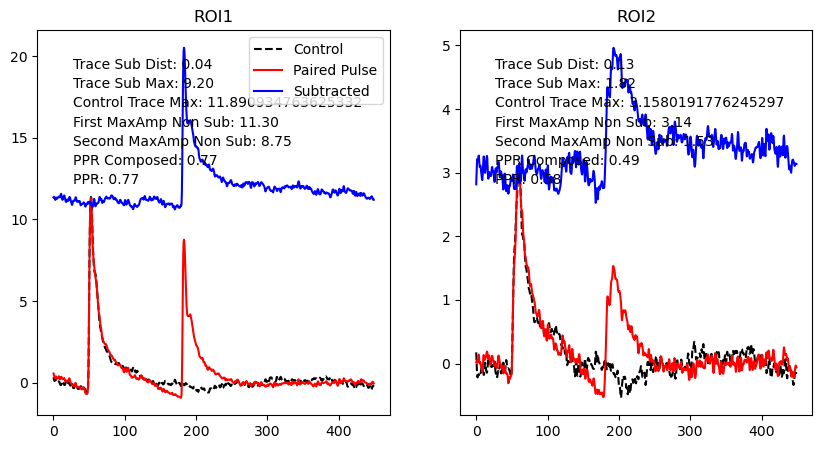

 1/2/2025 2_2 IPI 90ms


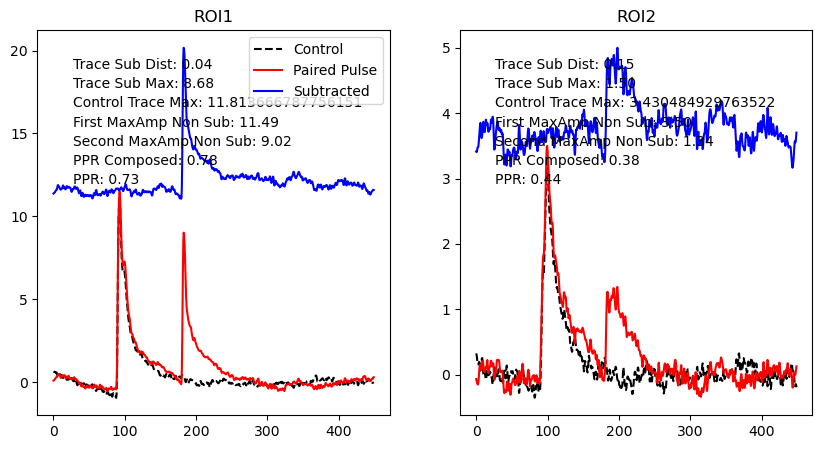

 1/7/2025 1_2 IPI 110ms


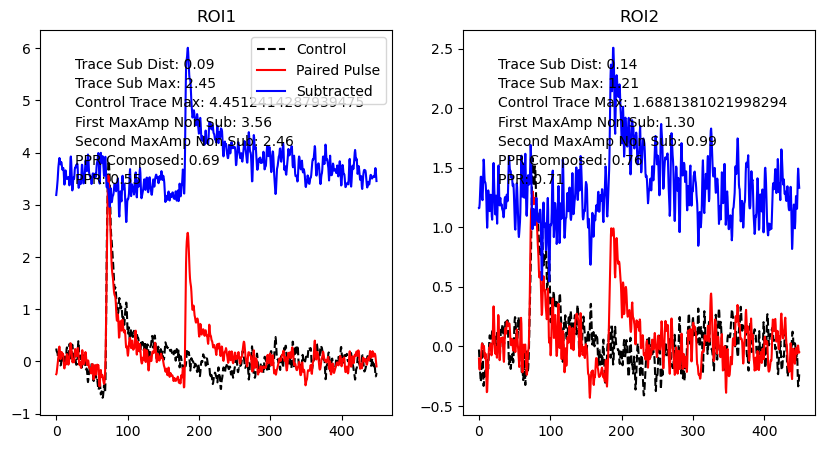

 1/7/2025 1_2 IPI 80ms


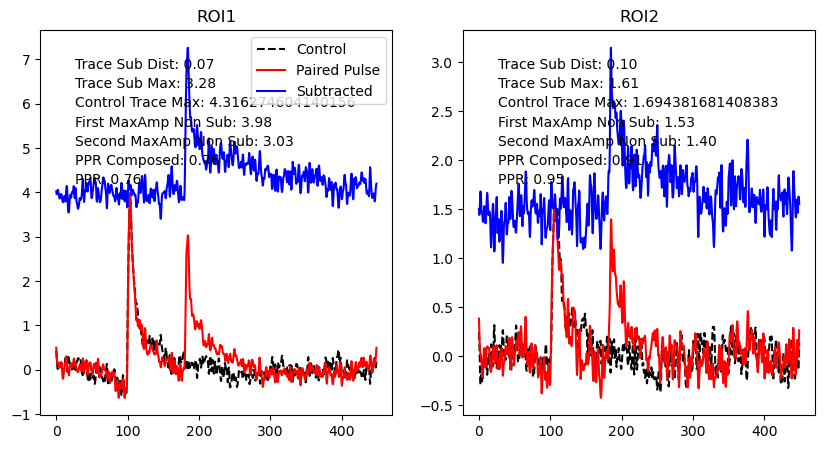

 1/7/2025 1_2 IPI 120ms


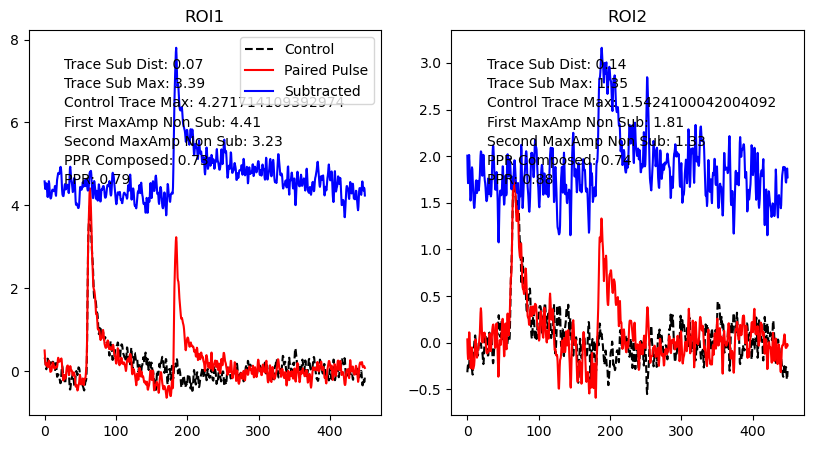

 1/7/2025 1_2 IPI 90ms


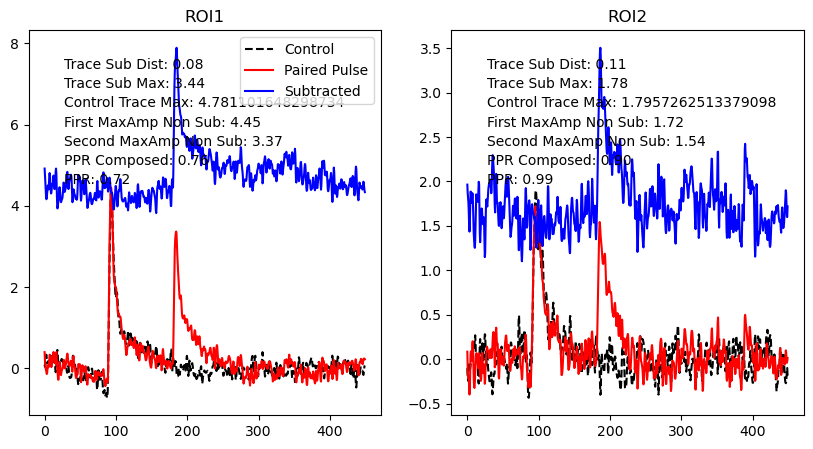

 1/7/2025 1_2 IPI 20ms


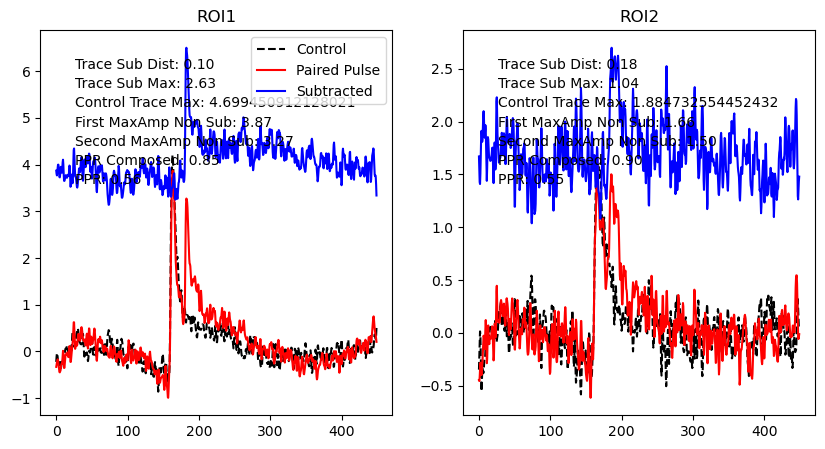

 1/7/2025 1_2 IPI 100ms


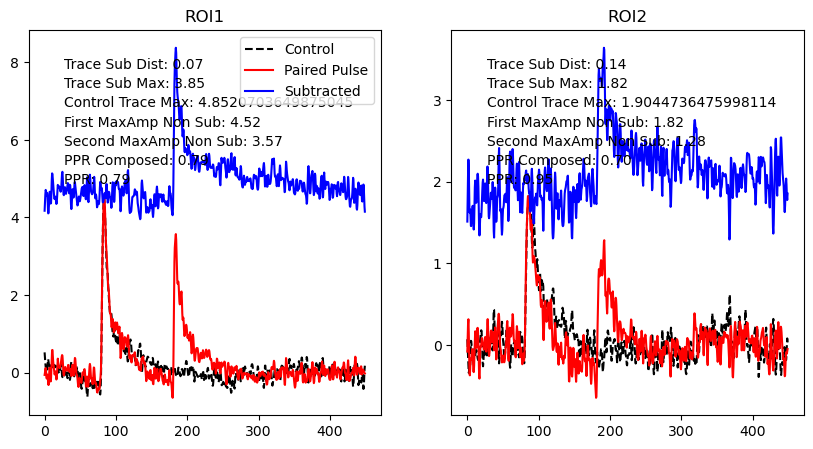

 1/7/2025 1_2 IPI 40ms


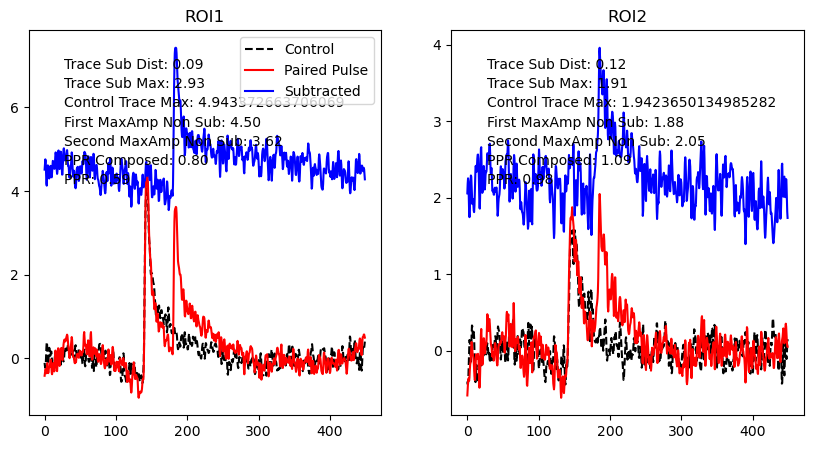

 1/7/2025 1_2 IPI 130ms


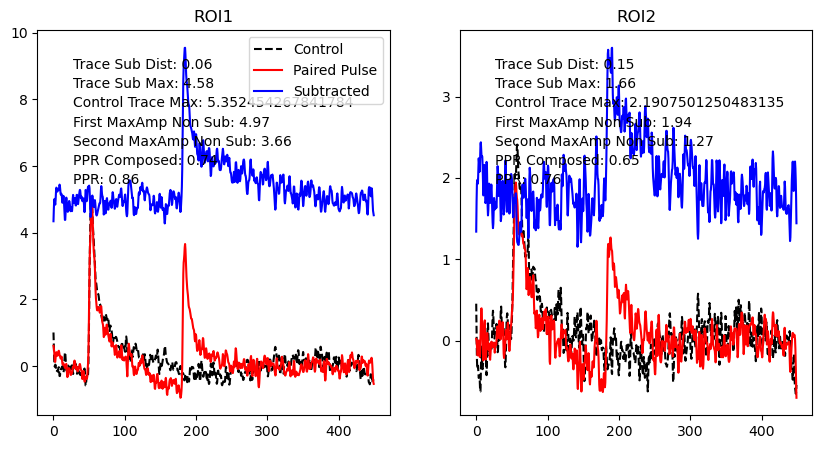

 1/7/2025 1_2 IPI 50ms


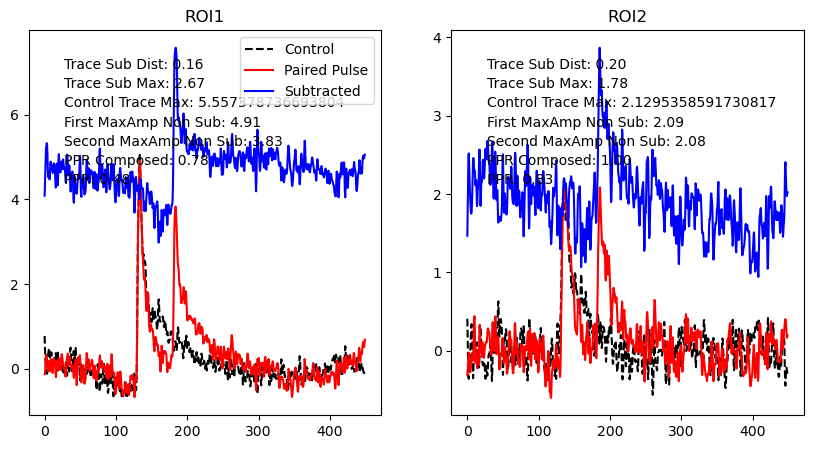

 1/7/2025 1_2 IPI 30ms


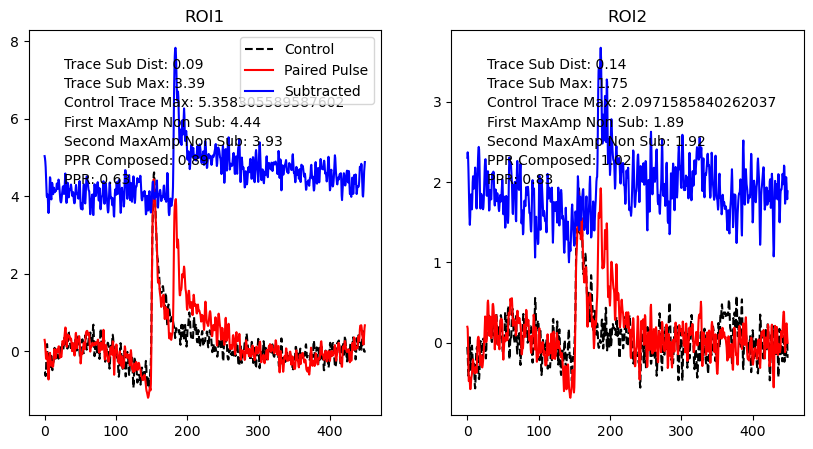

 1/7/2025 1_2 IPI 60ms


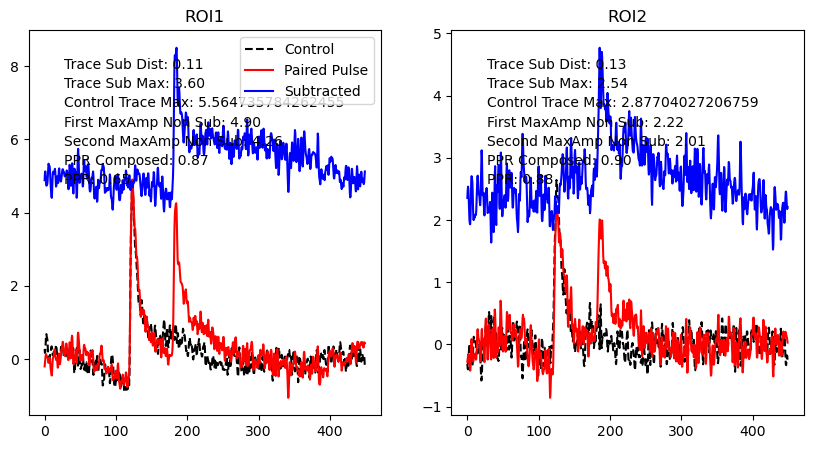

 1/7/2025 1_2 IPI 70ms


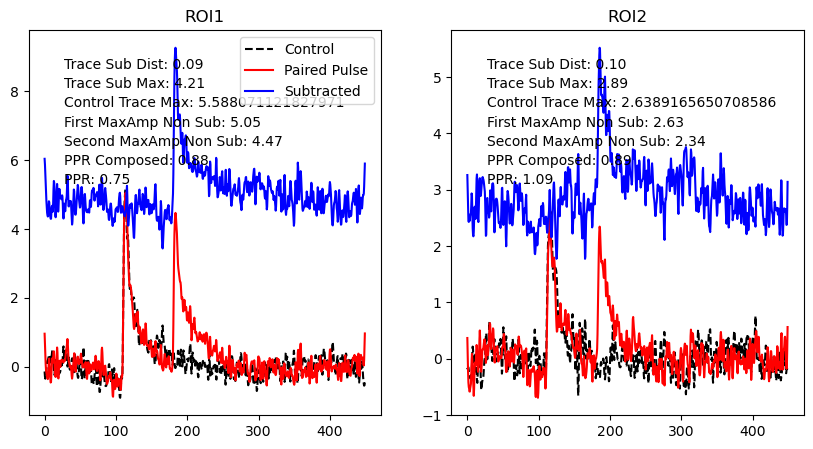

 1/7/2025 2_5 IPI 110ms


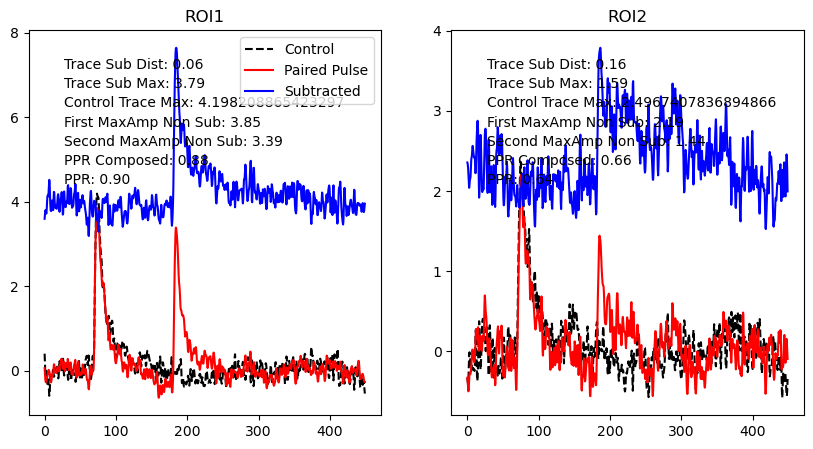

 1/7/2025 2_5 IPI 40ms


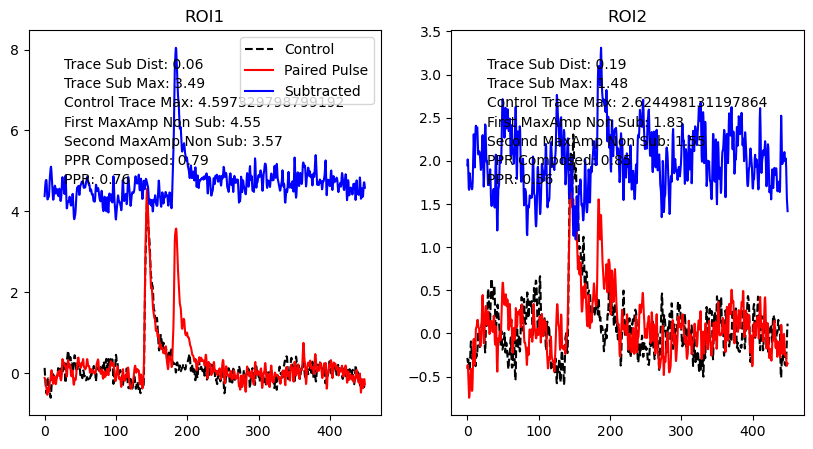

 1/7/2025 2_5 IPI 90ms


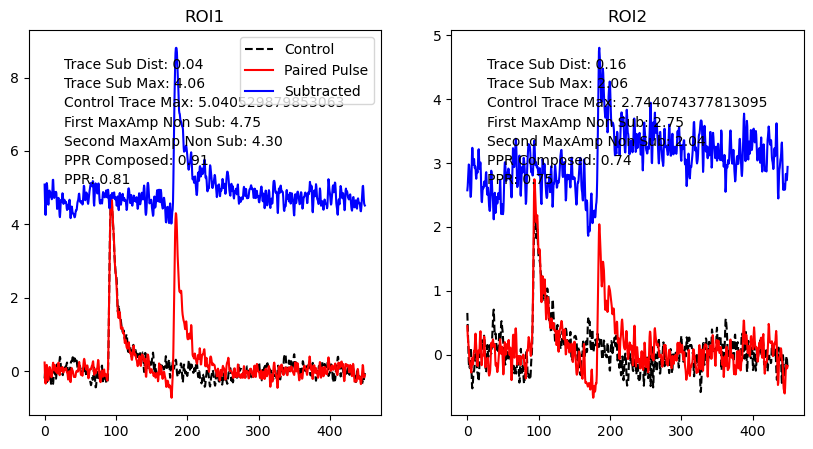

 1/7/2025 2_5 IPI 20ms


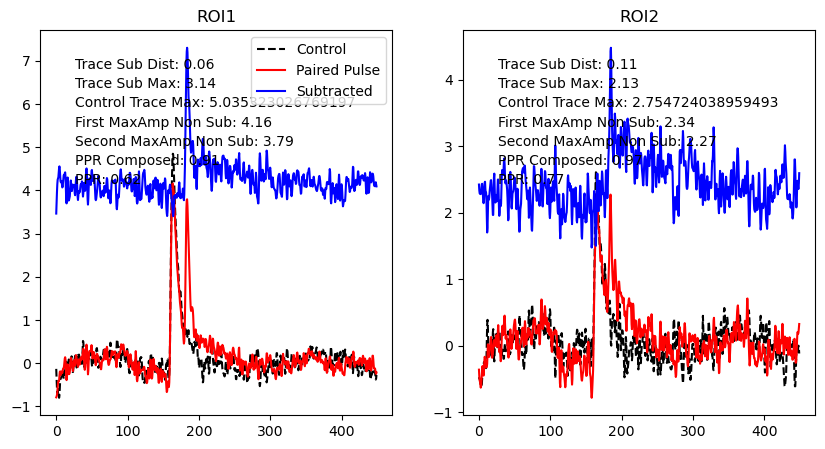

 1/7/2025 2_5 IPI 30ms


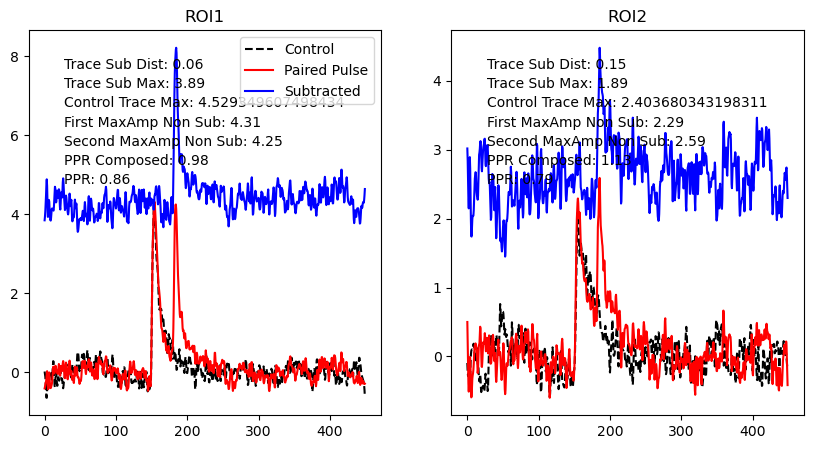

 1/7/2025 2_5 IPI 80ms


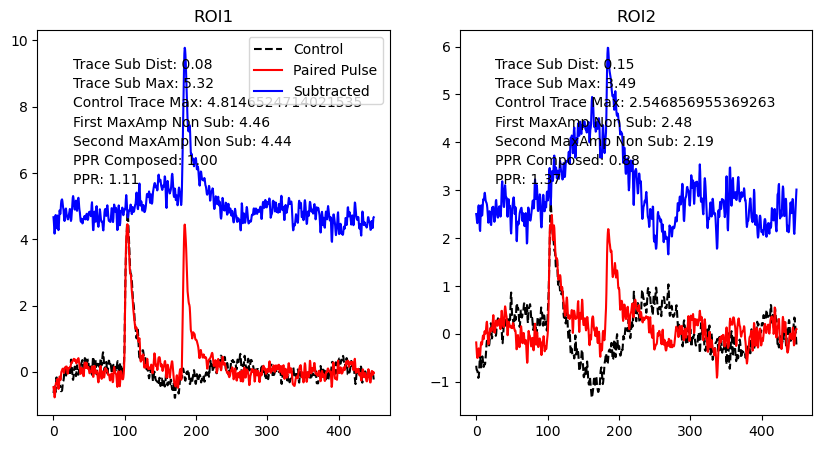

 1/7/2025 2_5 IPI 120ms


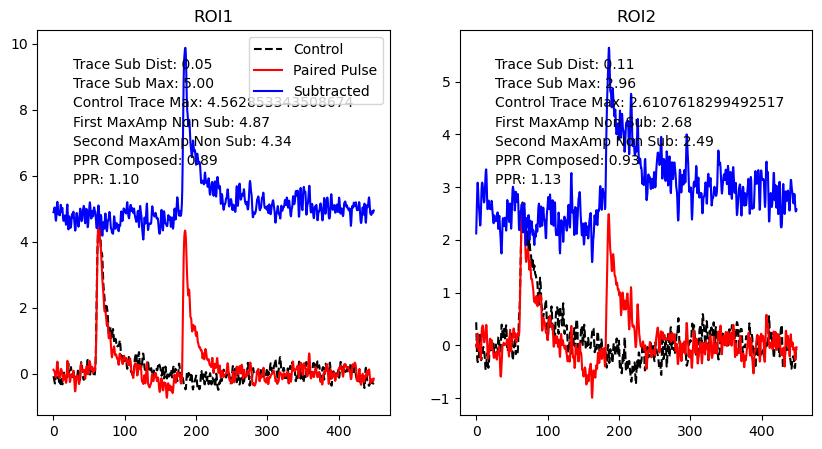

 1/7/2025 2_5 IPI 50ms


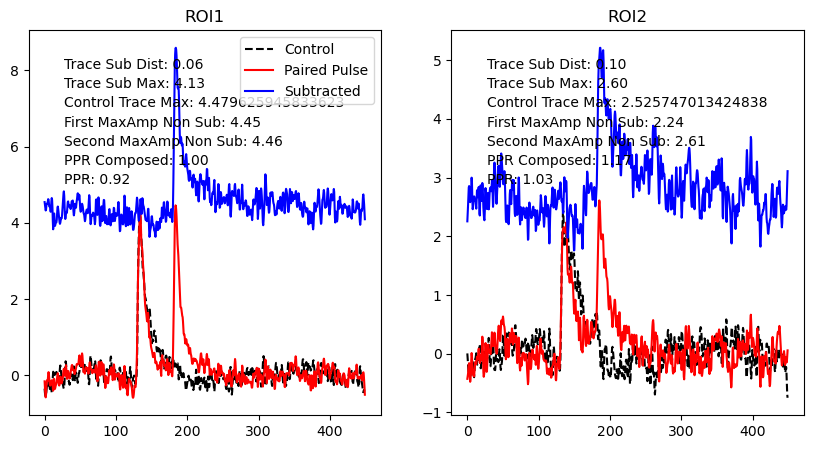

 1/7/2025 2_5 IPI 70ms


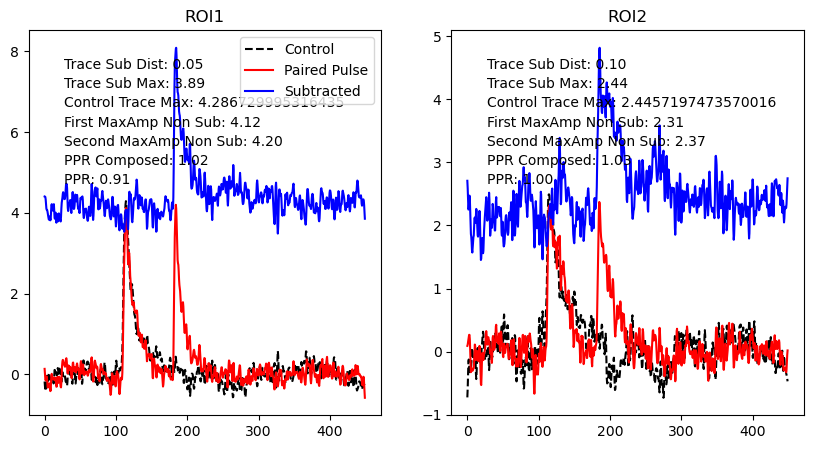

 1/7/2025 2_5 IPI 130ms


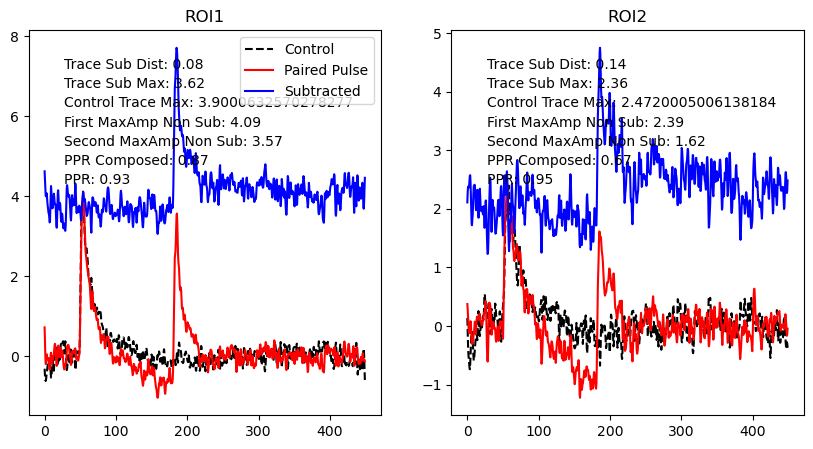

 1/7/2025 2_5 IPI 60ms
 1/7/2025 2_5 IPI 100ms


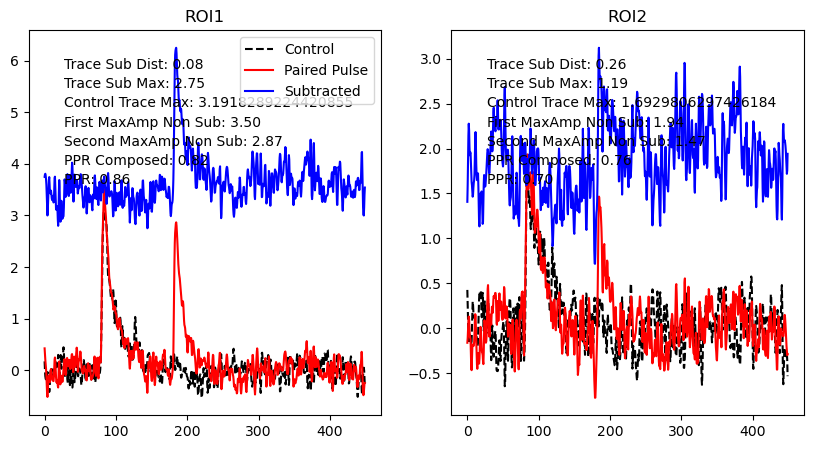

 1/7/2025 3_2 IPI 120ms


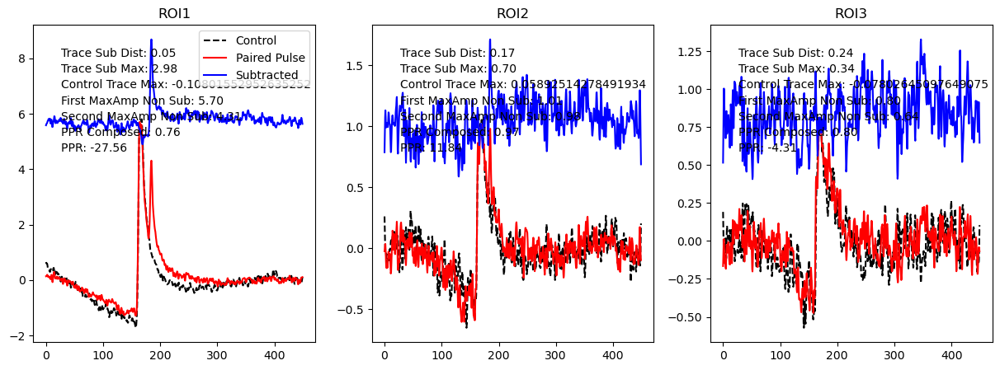

 1/7/2025 3_2 IPI 70ms


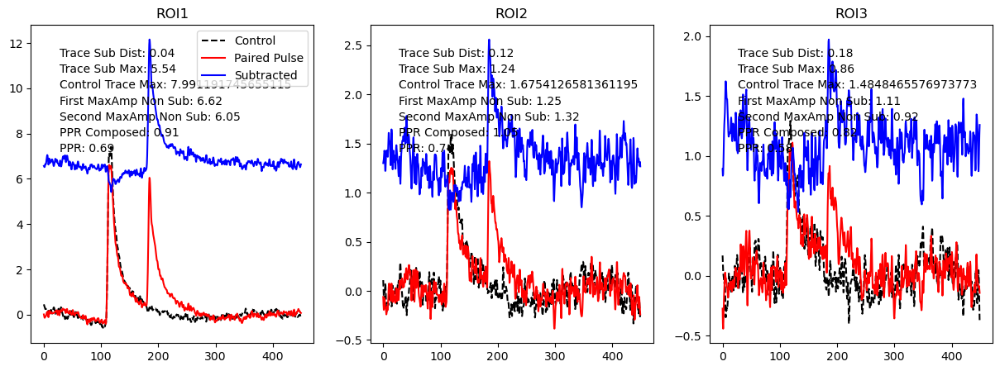

 1/7/2025 3_2 IPI 60ms


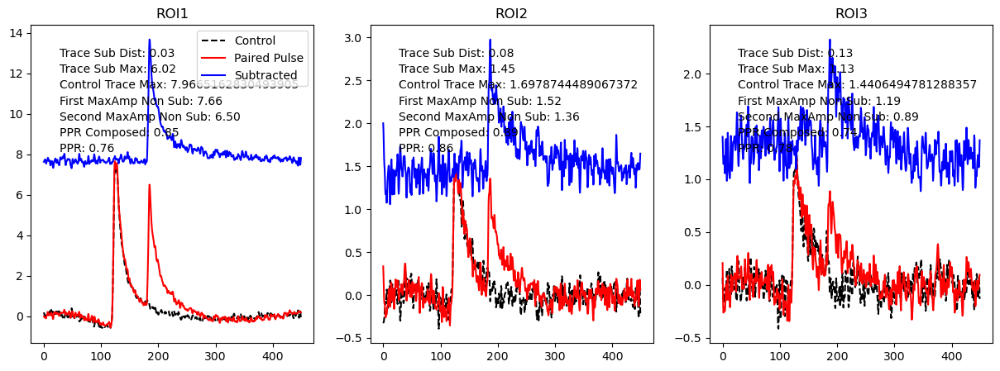

 1/7/2025 3_2 IPI 110ms


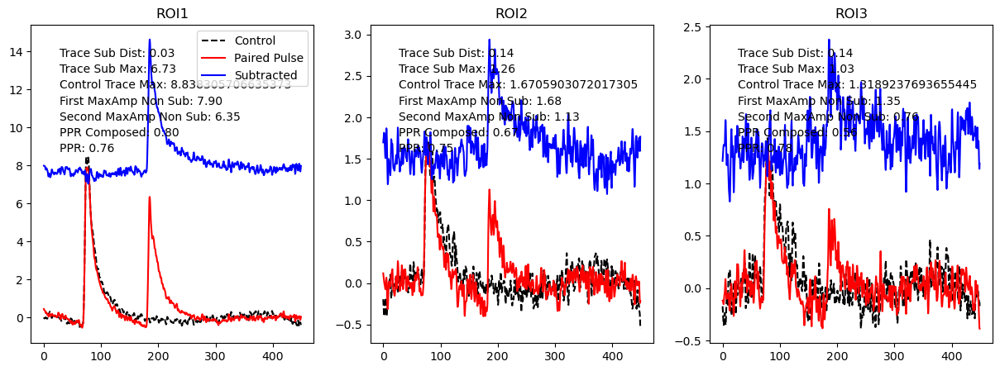

 1/7/2025 3_2 IPI 40ms


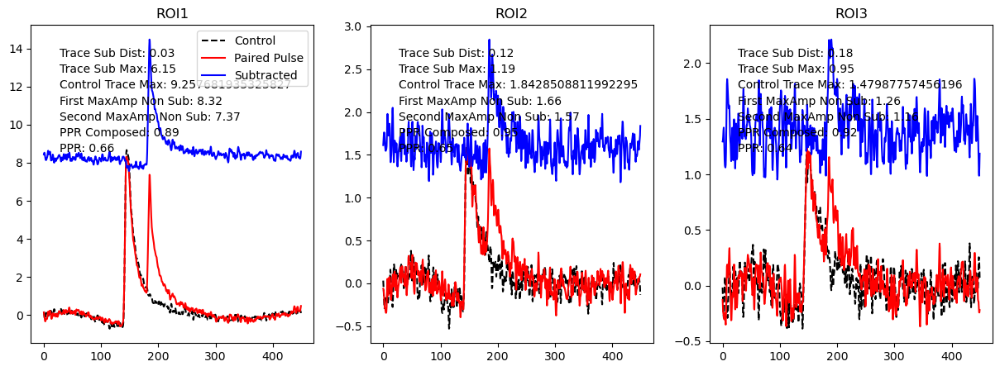

 1/7/2025 3_2 IPI 100ms


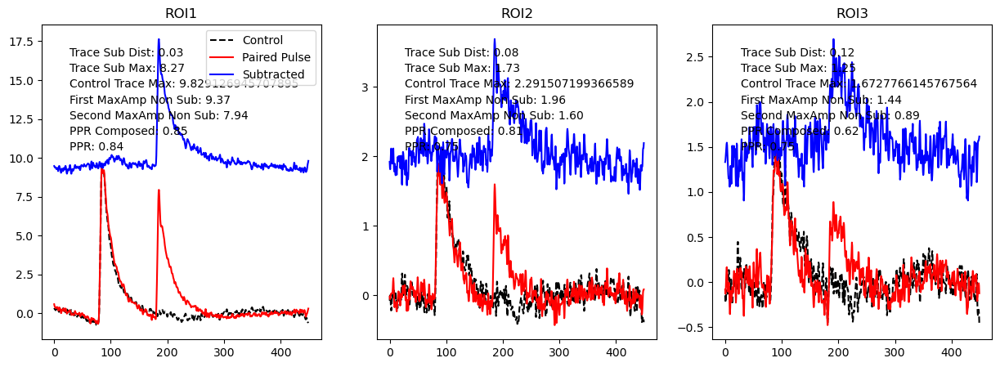

 1/7/2025 3_2 IPI 50ms


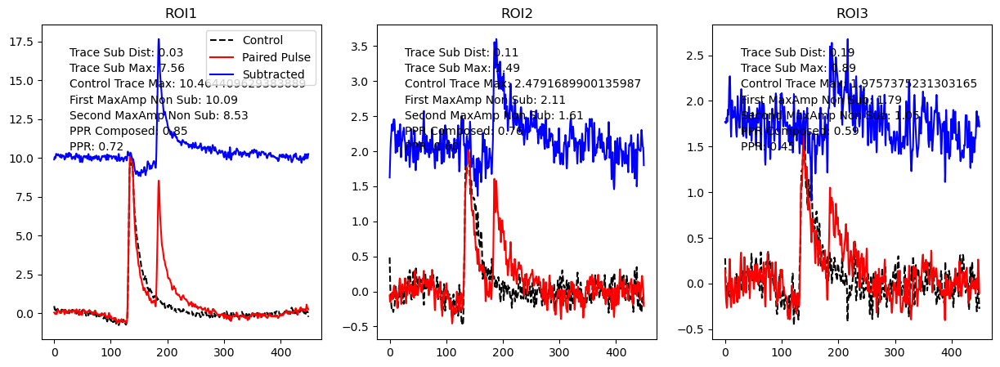

 1/7/2025 3_2 IPI 130ms


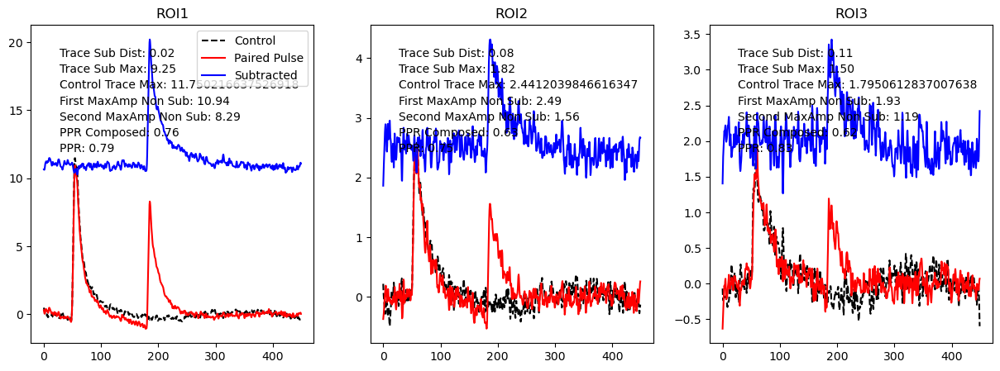

 1/7/2025 3_2 IPI 80ms


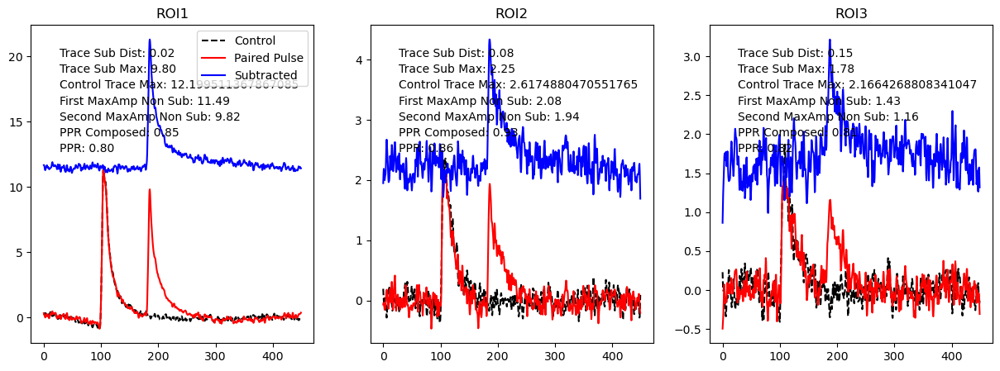

 1/7/2025 3_2 IPI 30ms


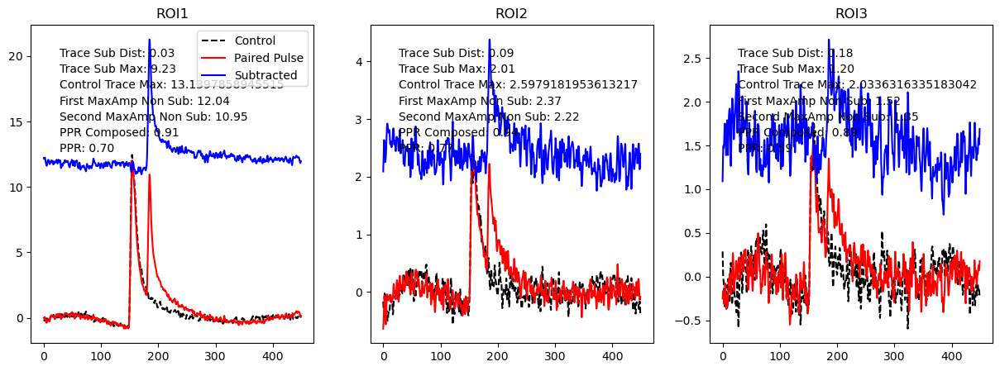

 1/7/2025 4_2 IPI 110ms


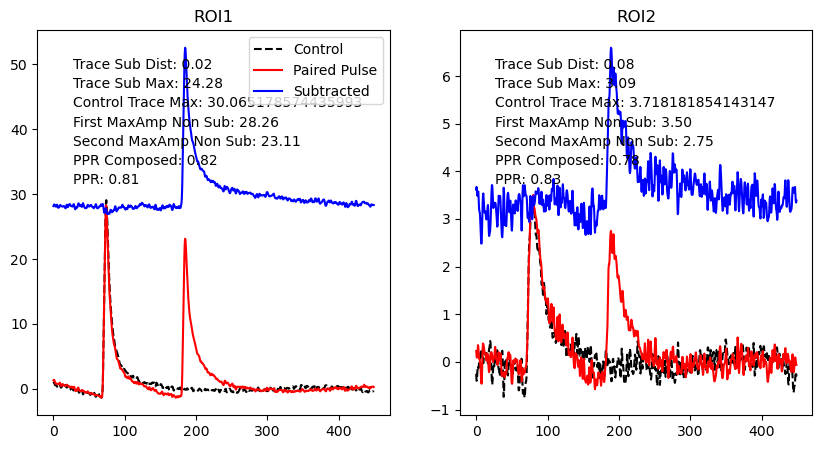

 1/7/2025 4_2 IPI 50ms


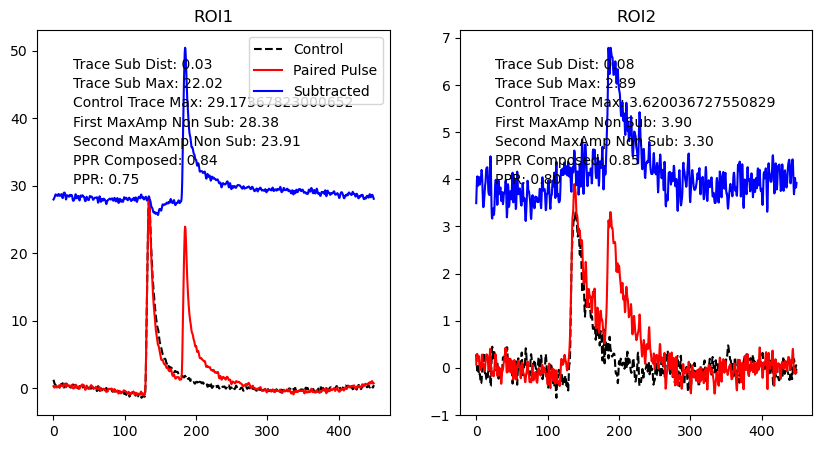

 1/7/2025 4_2 IPI 60ms


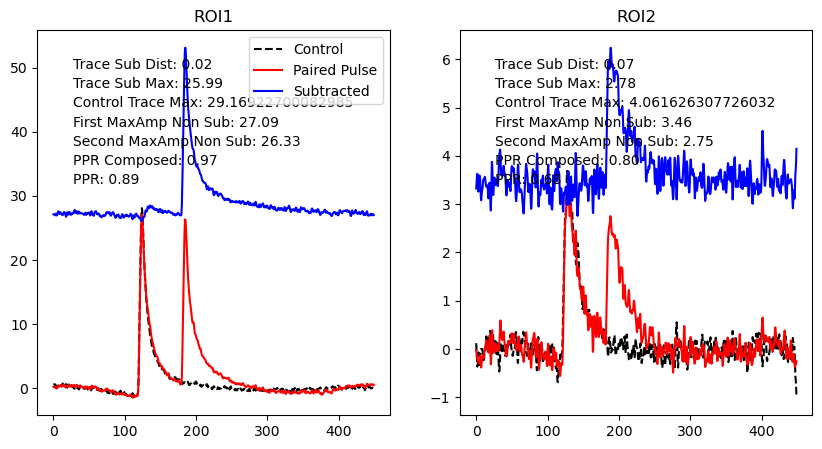

 1/7/2025 4_2 IPI 130ms


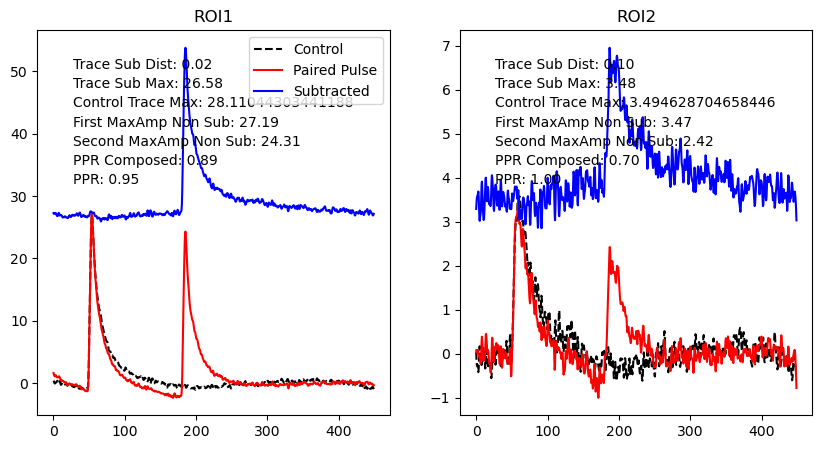

 1/7/2025 4_2 IPI 80ms


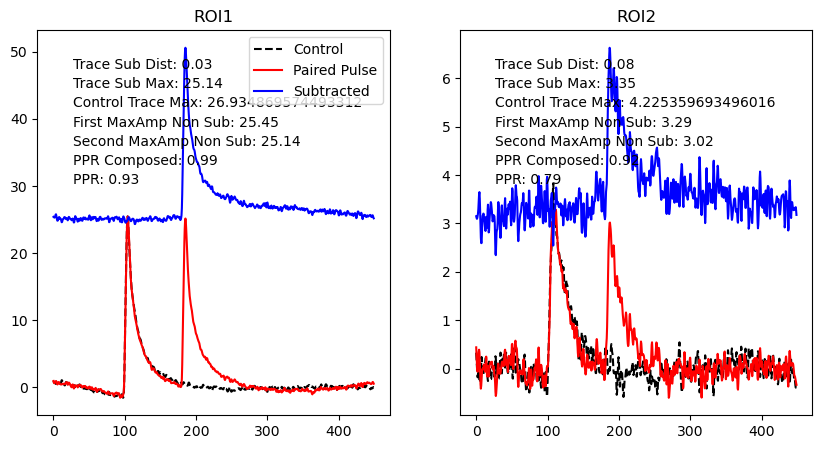

 1/7/2025 4_2 IPI 90ms


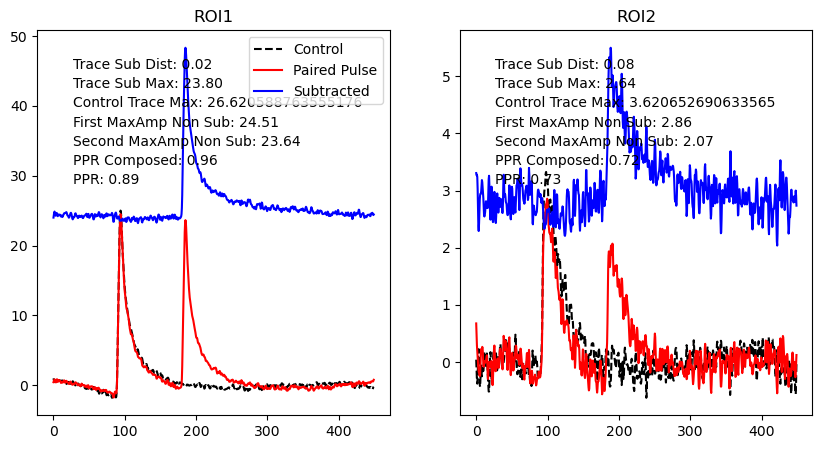

 1/7/2025 4_2 IPI 40ms


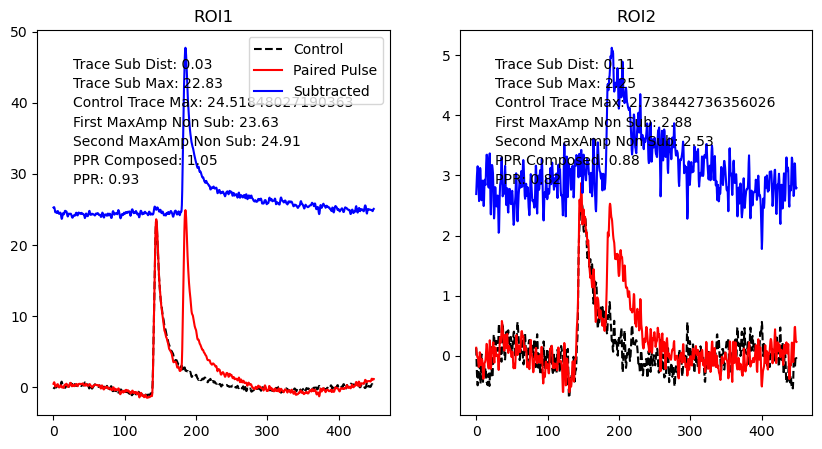

 1/7/2025 4_2 IPI 100ms


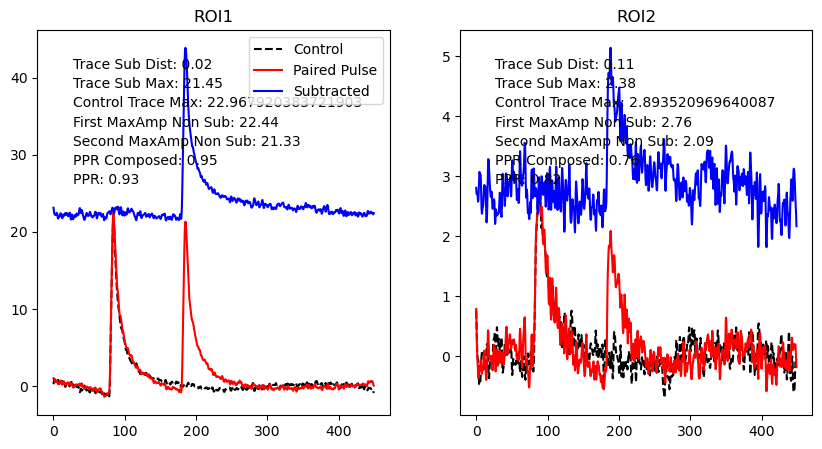

 1/7/2025 4_2 IPI 120ms


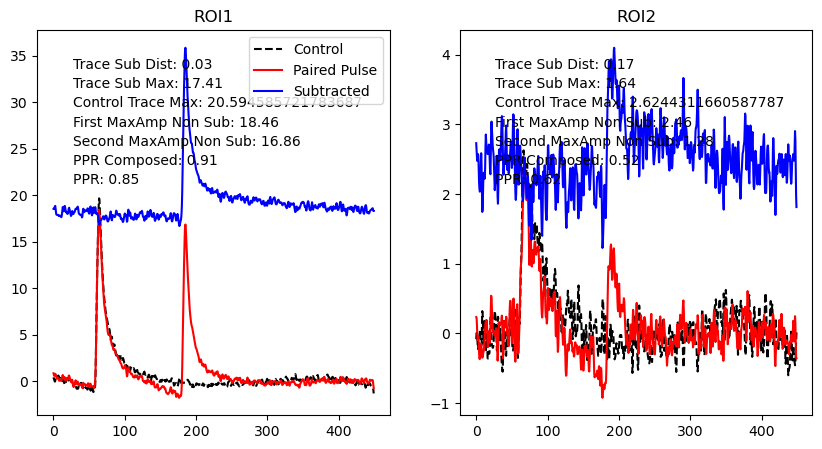

 1/7/2025 4_2 IPI 30ms


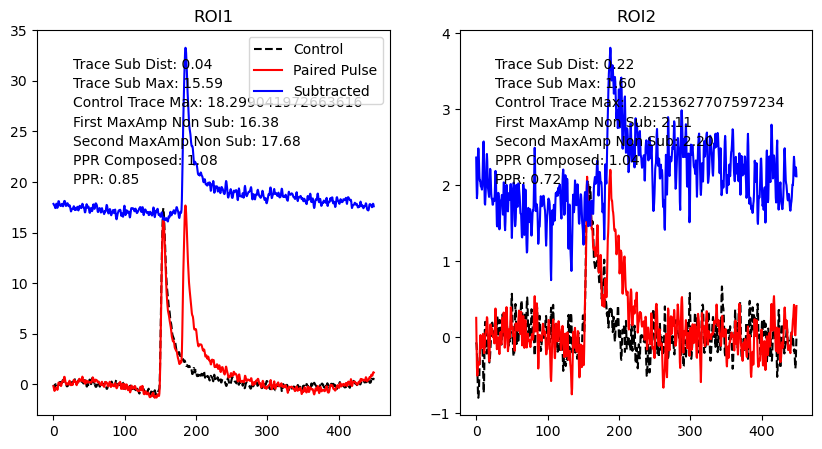

 1/7/2025 4_2 IPI 70ms


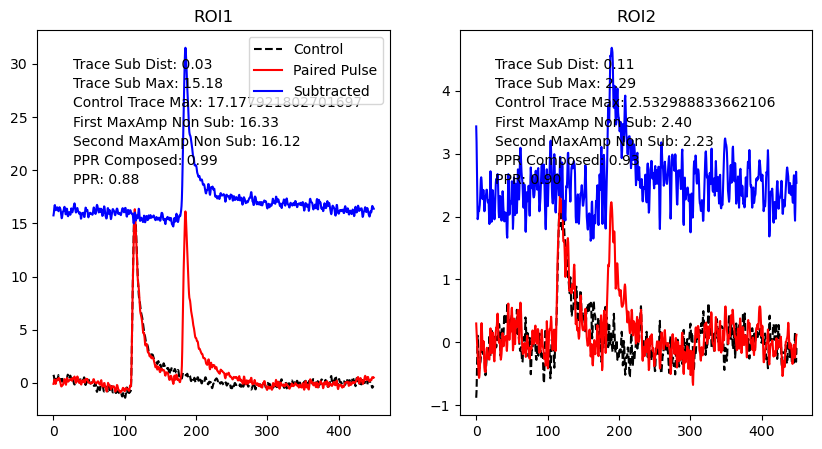

 1/7/2025 4_2 IPI 20ms


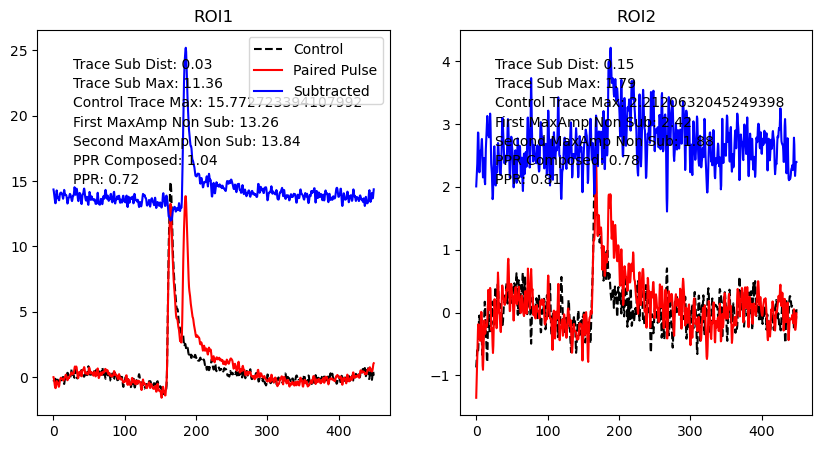

 11/6/2024 2_1 IPI 70ms


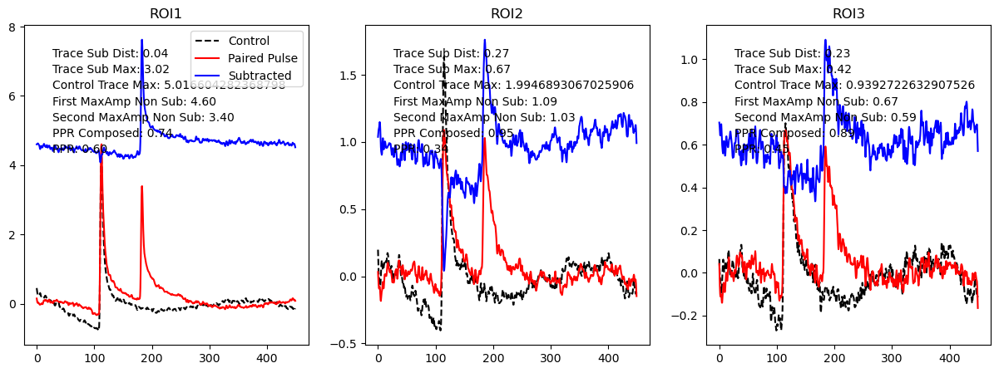

 11/6/2024 2_1 IPI 20ms


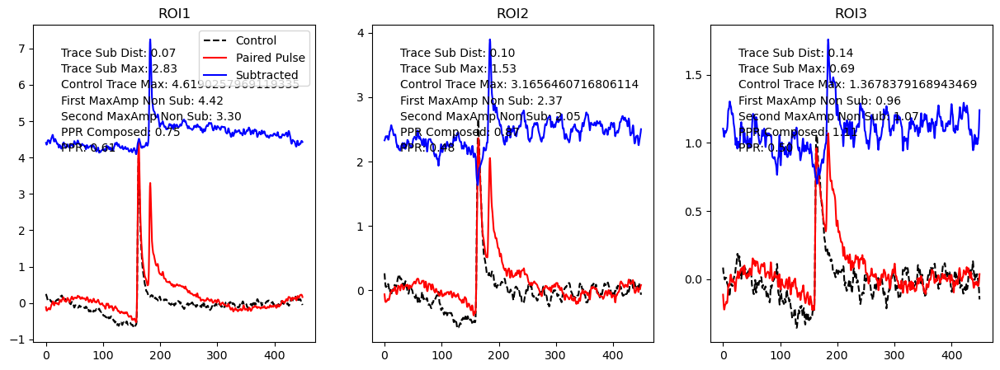

 11/6/2024 2_1 IPI 120ms


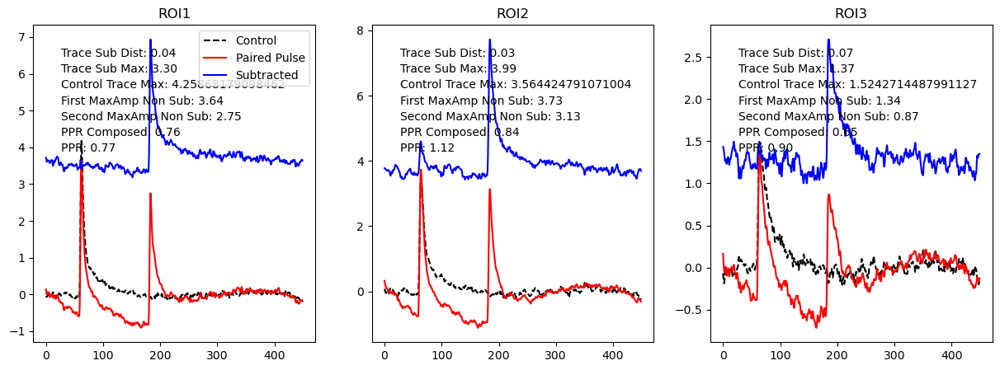

 12/11/2024 1_3 IPI 70ms


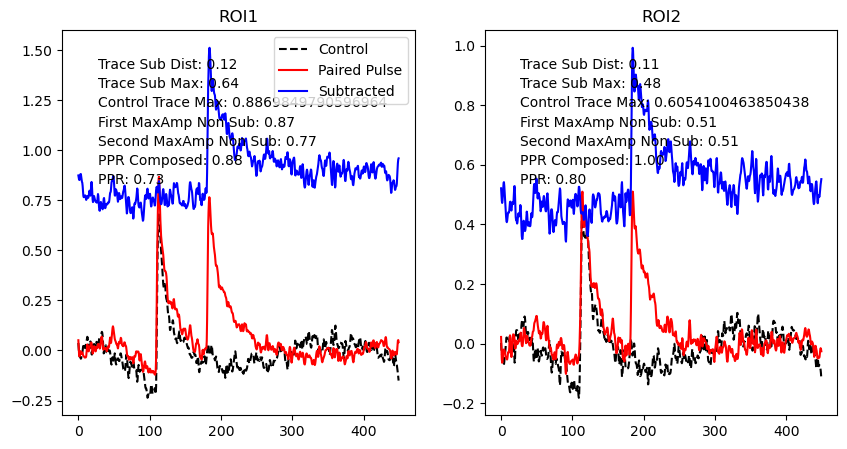

 12/11/2024 1_3 IPI 20ms


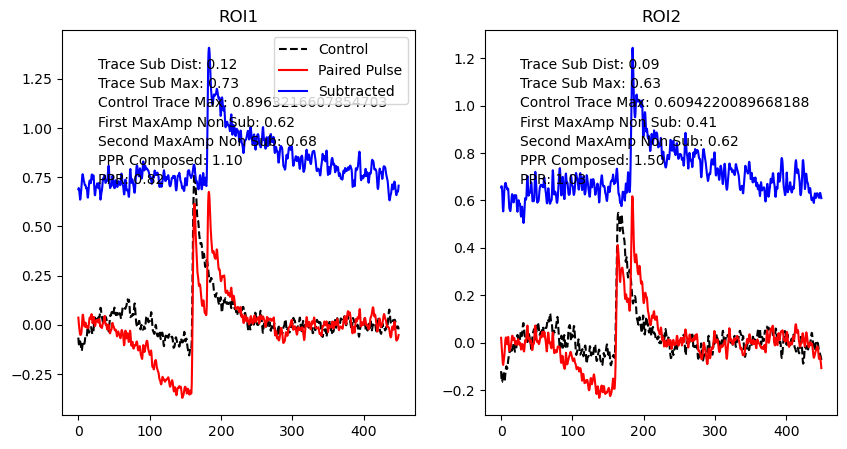

 12/11/2024 1_3 IPI 120ms


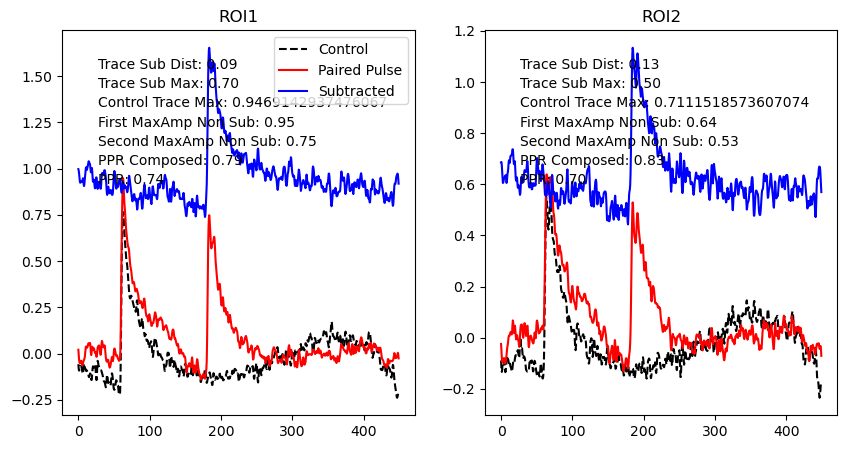

 12/11/2024 2_2 IPI 20ms


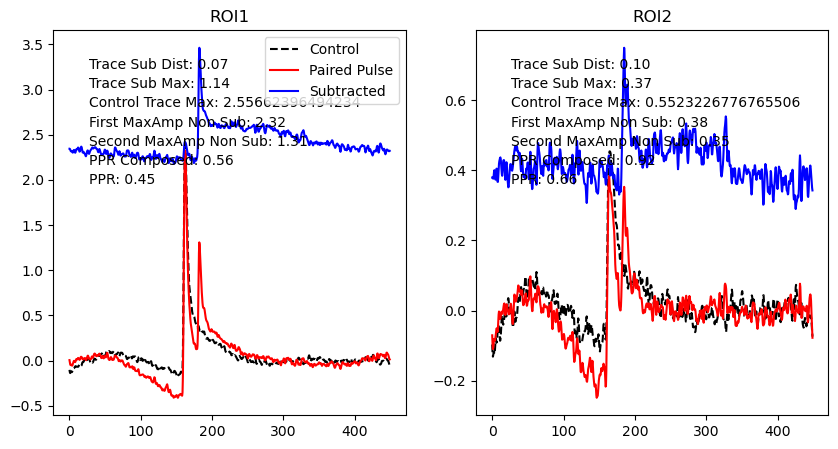

 12/11/2024 2_2 IPI 70ms


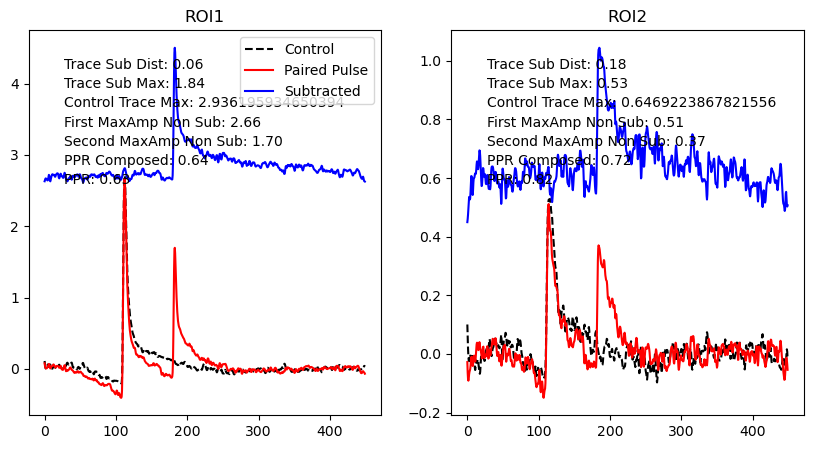

 12/11/2024 2_2 IPI 120ms


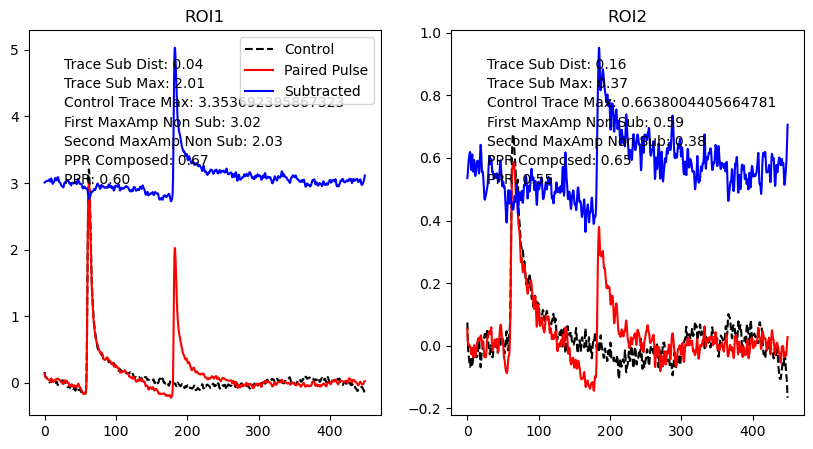

 12/11/2024 3_3 IPI 120ms


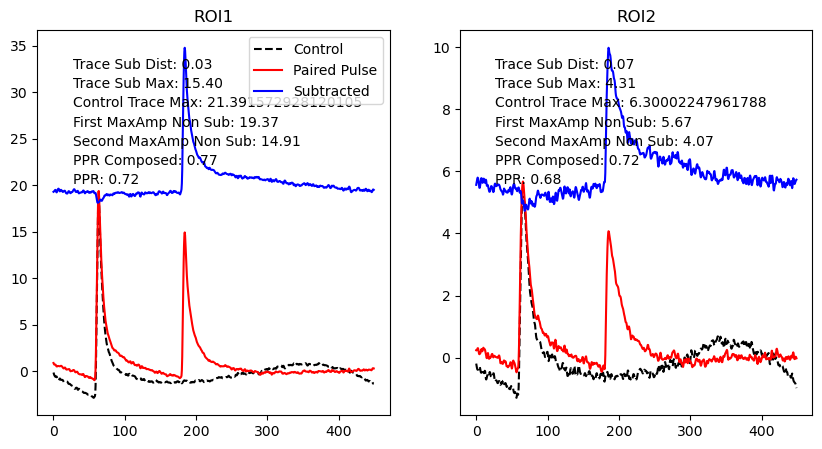

 12/11/2024 3_3 IPI 20ms


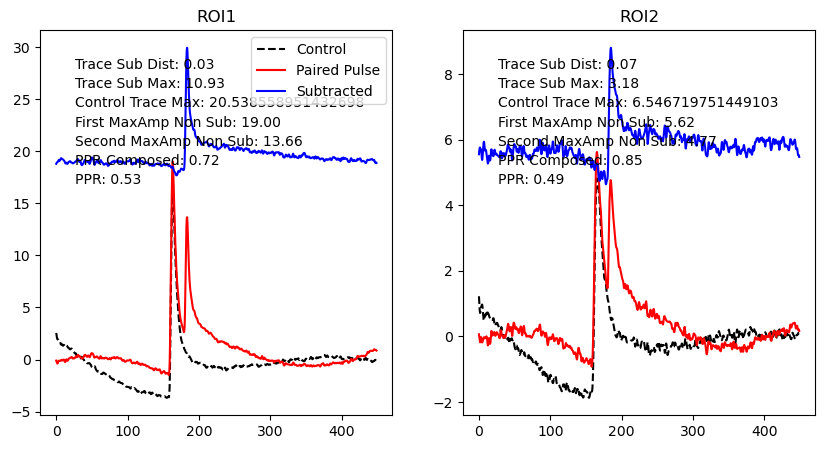

 12/11/2024 3_3 IPI 70ms


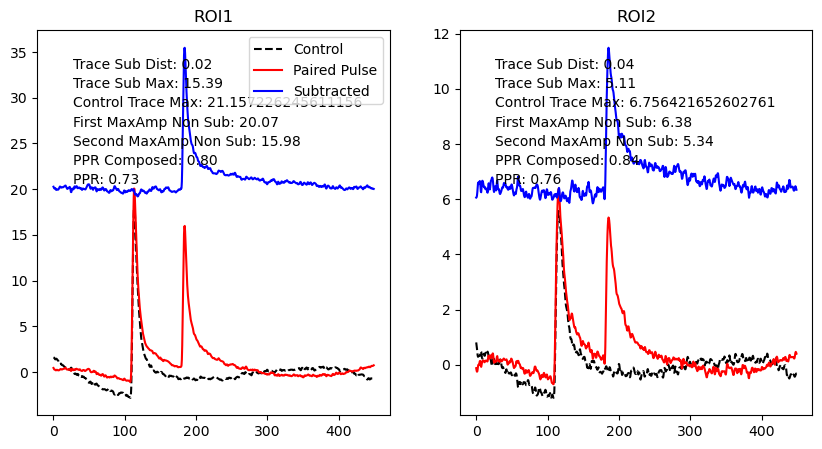

 12/18/2024 1_2 IPI 50ms


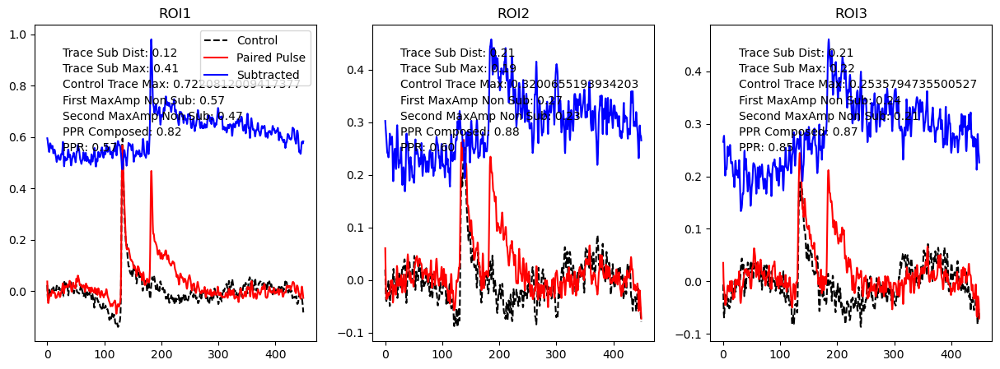

 12/18/2024 1_2 IPI 20ms


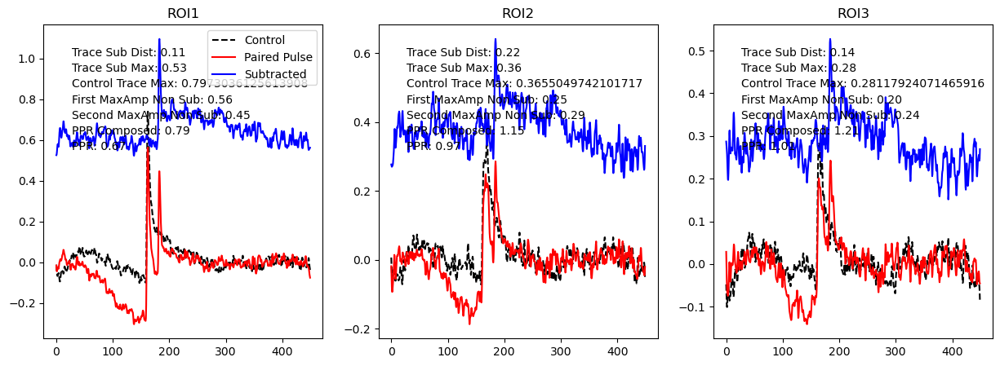

 12/18/2024 1_2 IPI 130ms


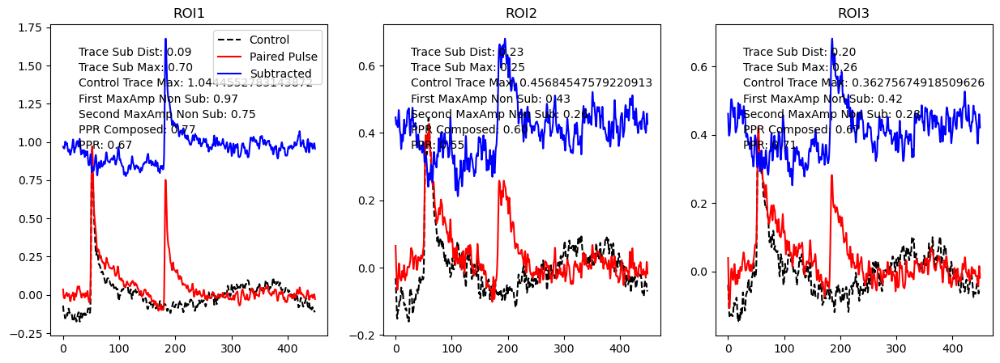

 12/18/2024 1_2 IPI 70ms


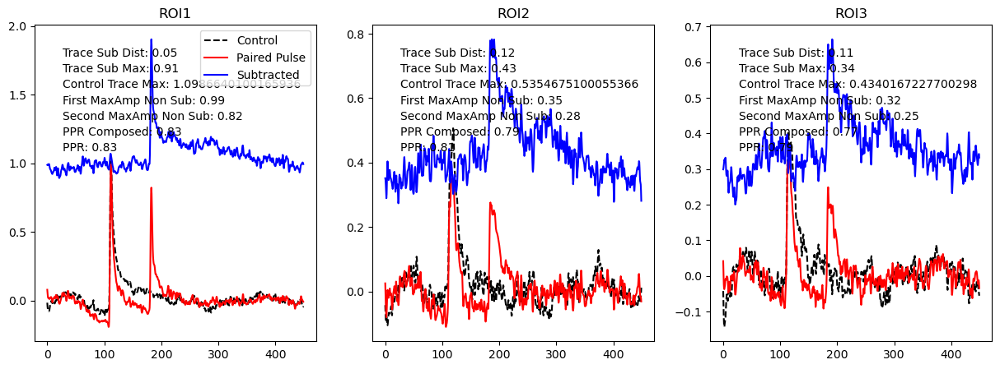

 12/18/2024 1_2 IPI 60ms


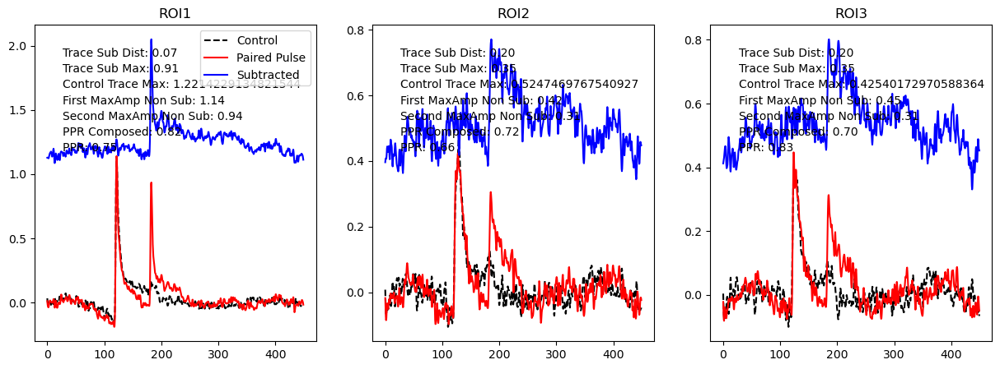

 12/18/2024 1_2 IPI 90ms


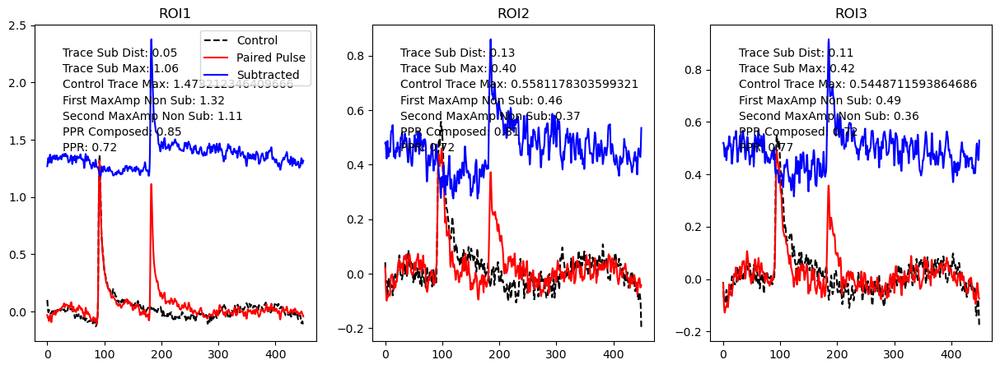

 12/18/2024 1_2 IPI 100ms


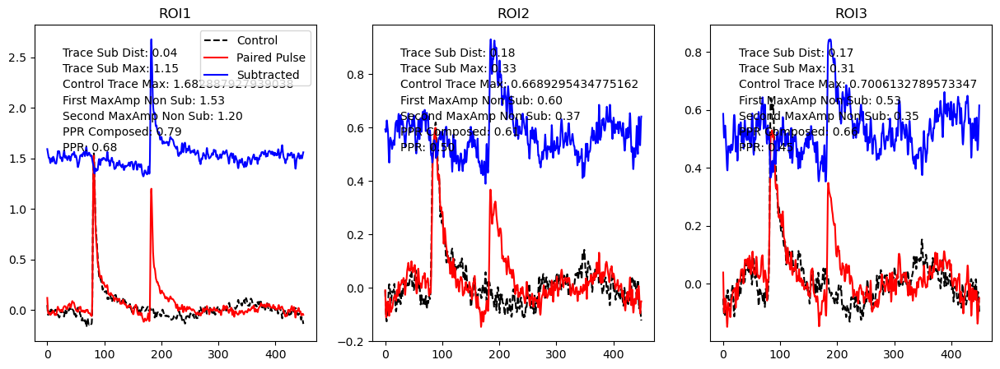

 12/18/2024 1_2 IPI 120ms


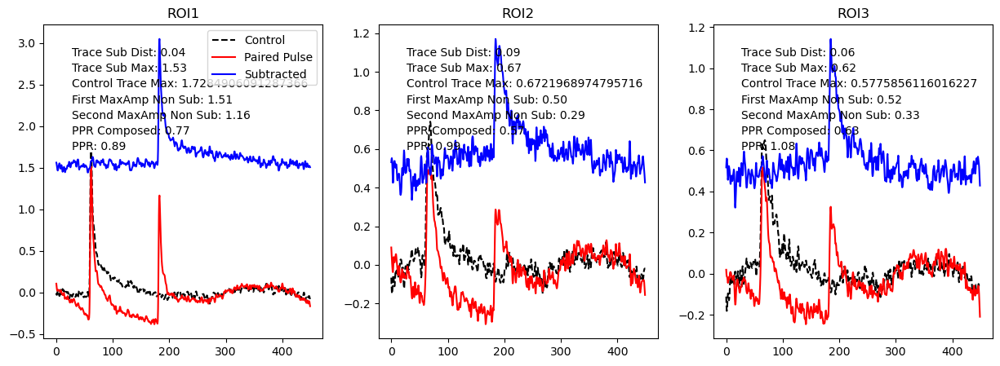

 12/18/2024 1_2 IPI 80ms


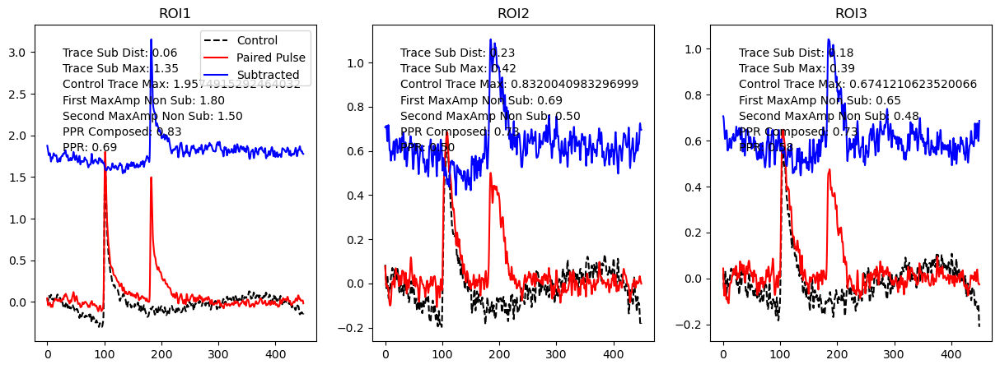

 12/18/2024 1_2 IPI 40ms


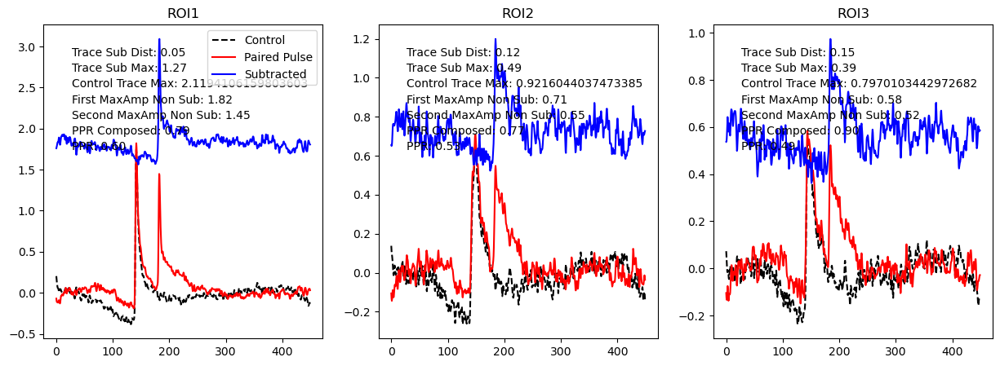

 12/18/2024 1_2 IPI 110ms


In [ ]:
for date in ppr_df['Date'].unique():
    date_df = ppr_df[ppr_df['Date'] == date]
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            slic_loc_id = f"{slic}_{loc}"
            for ipi in loc_df['IPI'].unique():
                ipi_df = loc_df[loc_df['IPI'] == ipi]
                print(f" {date} {slic_loc_id} IPI {ipi}ms")
                
                # for each ROI, there should be two rows in ipi_df, one for control 
                # (is_single_pulse_control = 1) and one for experimental
                # (is_single_pulse_control = 0)
                # the trace files are the same for each ROI, so we can just load them once
                control_df = ipi_df[ipi_df['is_single_pulse_control'] == 1]
                ppr_sub_df = ipi_df[ipi_df['is_single_pulse_control'] == 0]
                
                # load trace and trace_non_polyfit files
                control_trace = read_dat_trace_file(control_df['trace'].values[0])
                control_trace_non_polyfit = read_dat_trace_file(control_df['trace_non_polyfit'].values[0])
                ppr_trace = read_dat_trace_file(ppr_sub_df['trace'].values[0])
                ppr_trace_non_polyfit = read_dat_trace_file(ppr_sub_df['trace_non_polyfit'].values[0])

                # subtract non-polyfit control from ppr
                sub_non_polyfit = ppr_trace_non_polyfit - control_trace_non_polyfit

                # calculate the dist from zero of subtracted trace around the second stim
                trace_sub_dist = sub_non_polyfit[(sub_non_polyfit.index < 356) | (sub_non_polyfit.index > 550)].abs().mean()
                # normalize this to the max of the trace within the the second stim measure window
                trace_sub_dist = trace_sub_dist / sub_non_polyfit[(sub_non_polyfit.index > 356) | (sub_non_polyfit.index < 550)].max()

                # calculate maxAmp of subtracted trace in measure window of second stim (356-450)
                trace_sub_max = sub_non_polyfit[(sub_non_polyfit.index > 356) & (sub_non_polyfit.index < 450)].max()

                # perform baseline correction on control trace 
                first_stim_start = 356 - (ipi * 2)
                exclusion_window = (first_stim_start, first_stim_start + 290)
                bc = BaselineCorrection(control_trace_non_polyfit, exclusion_windows=[exclusion_window])
                control_trace_max = {}
                control_trace_corrected = {}
                for roi in control_trace.columns:
                    if roi == 'Pt':
                        continue
                    control_trace_corrected[roi] = bc.fit_baseline(roi, date+ " " + slic_loc_id + " IPI " + str(ipi) + "ms")
                    # measure MaxAmp of control trace in first stim site measure window

                    control_trace_max[roi] = control_trace_non_polyfit[(control_trace_non_polyfit.index > first_stim_start) 
                                                        & (control_trace_non_polyfit.index < first_stim_start + 104)]['Corrected_'+roi].max()

                # extract first and second maxAmp of ppr_trace. This is the non-subtracted PPR.
                first_maxAmp_non_sub = ppr_trace[(ppr_trace.index > first_stim_start) & 
                                                      (ppr_trace.index < 345)].max()
                second_maxAmp_non_sub = ppr_trace[(ppr_trace.index > 356) & (ppr_trace.index < 550)].max()

                # filter based on trace_sub_dist
                skip_plot = False
                if trace_sub_dist.mean() > 0.18:
                    skip_plot = True

                # plot all traces
                n_rois = len(control_trace.columns) - 1
                fig, ax = None, None
                if not skip_plot:
                    fig, ax = plt.subplots(1, n_rois, figsize=(n_rois * 5, 5))
                for i_roi, roi in enumerate(control_trace.columns):
                    
                    if roi == 'Pt':
                        continue
                    if not skip_plot:
                        t = control_trace.index * 0.5
                        
                        ax[i_roi-1].plot(t, control_trace[roi], label="Control", color='black', linestyle='--')
                        ax[i_roi-1].plot(t, ppr_trace[roi], label='Paired Pulse', color='red')
                        ax[i_roi-1].plot(t, sub_non_polyfit[roi] + ppr_trace[roi].max(), label='Subtracted', color='blue')

                                    # calculate PPR and PPR subtracted
                    ppr_composed = 0
                    if first_maxAmp_non_sub[roi] != 0:
                        ppr_composed = second_maxAmp_non_sub[roi] / first_maxAmp_non_sub[roi]
                    ppr = 0
                    if control_trace_max[roi] != 0:
                        ppr = trace_sub_max[roi] / control_trace_max[roi]
                
                    # annotate with trace_sub_dist, trace_sub_max, control_trace_max, first_maxAmp_non_sub, second_maxAmp_non_sub,
                    # ppr_composed, and ppr
                    if not skip_plot:
                        ax[i_roi-1].text(0.1, 0.9, f"Trace Sub Dist: {trace_sub_dist[roi]:.2f}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.85, f"Trace Sub Max: {trace_sub_max[roi]:.2f}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.8, f"Control Trace Max: {control_trace_max[roi]}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.75, f"First MaxAmp Non Sub: {first_maxAmp_non_sub[roi]:.2f}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.7, f"Second MaxAmp Non Sub: {second_maxAmp_non_sub[roi]:.2f}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.65, f"PPR Composed: {ppr_composed:.2f}", transform=ax[i_roi-1].transAxes)
                        ax[i_roi-1].text(0.1, 0.6, f"PPR: {ppr:.2f}", transform=ax[i_roi-1].transAxes)

                        # title with ROI
                        ax[i_roi-1].set_title(roi)
                    i_roi_ = int(roi[-1])

                    # store in dataframe for later analysis for this date, slice, loc, ipi, and roi
                    ppr_df.loc[(ppr_df['Date'] == date) & (ppr_df['Slice'] == slic) & (ppr_df['ROI'] == i_roi_) &
                                        (ppr_df['Location'] == loc) & (ppr_df['IPI'] == ipi), 'Trace Sub Dist'] = trace_sub_dist[roi]
                    ppr_df.loc[(ppr_df['Date'] == date) & (ppr_df['Slice'] == slic) & (ppr_df['ROI'] == i_roi_) &
                                        (ppr_df['Location'] == loc) & (ppr_df['IPI'] == ipi), 'MaxAmp 1'] = trace_sub_max[roi]
                    ppr_df.loc[(ppr_df['Date'] == date) & (ppr_df['Slice'] == slic) & (ppr_df['ROI'] == i_roi_) &
                                        (ppr_df['Location'] == loc) & (ppr_df['IPI'] == ipi), 'MaxAmp 2'] = control_trace_max[roi]
                    ppr_df.loc[(ppr_df['Date'] == date) & (ppr_df['Slice'] == slic) & (ppr_df['ROI'] == i_roi_) &
                                        (ppr_df['Location'] == loc) & (ppr_df['IPI'] == ipi), 'MaxAmp 1 Composed'] = first_maxAmp_non_sub[roi]
                    ppr_df.loc[(ppr_df['Date'] == date) & (ppr_df['Slice'] == slic) & (ppr_df['ROI'] == i_roi_) &
                                        (ppr_df['Location'] == loc) & (ppr_df['IPI'] == ipi), 'MaxAmp 2 Composed'] = second_maxAmp_non_sub[roi]
                    ppr_df.loc[(ppr_df['Date'] == date) & (ppr_df['Slice'] == slic) & (ppr_df['ROI'] == i_roi_) &
                                        (ppr_df['Location'] == loc) & (ppr_df['IPI'] == ipi), 'PPR Composed'] = ppr_composed
                    ppr_df.loc[(ppr_df['Date'] == date) & (ppr_df['Slice'] == slic) & (ppr_df['ROI'] == i_roi_) &
                                        (ppr_df['Location'] == loc) & (ppr_df['IPI'] == ipi), 'PPR'] = ppr                                        

                # save the figure
                if not skip_plot:
                    
                    ax[0].legend()
                    
                    # save in the same directory as the CSV, but in a folder called "traces"
                    if not os.path.exists(f"{data_dir}traces"):
                        os.makedirs(f"{data_dir}traces")
                    formatted_date = date.replace('/', '-')
                    
                    fig.savefig(f"{data_dir}traces/{formatted_date}_{slic_loc_id}_IPI_{ipi}ms.png")
                    plt.show()

In [ ]:
# restrict to is_single_pulse_control = 0 (to avoid duplicates)
ppr_df = ppr_df[ppr_df['is_single_pulse_control'] == 0]

# and restrict to substring 'pulse1' in "ROI_Set" column (to avoid duplicates)
ppr_df = ppr_df[ppr_df['ROI_Set'].str.contains('pulse1')]

# how many unique date, slice, location combinations are there?
n_unique = len(ppr_df.groupby(['Date', 'Slice', 'Location']).size())
n_unique

29

In [ ]:
# plot the PPR and PPR Composed, separated by IPI, separated 
# for home barrel (ROI = 1), medial barrel, and lateral barrel (Medial/Lateral columns)
# group by IPI, and Medial/Lateral columns
plt.rcParams.update({'font.size': 26})

# initialize empty dataframe with PPR, IPI, Medial_Lateral, Rostral_Caudal, and Section
# record only the data that makes it into the final plot
ppr_final_df = pd.DataFrame(columns=['Date', 'PPR', 'PPR Composed', 'IPI', 'Direction', 'Section'])

directions_by_section = {"Coronal": "Medial/Lateral", "Sagittal": "Rostral/Caudal"}
sections = ['Coronal', 'Sagittal']
for section in sections:
    directions = directions_by_section[section].split('/')
    ppr_df_section = ppr_df[ppr_df['Section'] == section]
    ppr_coronal_grouped = ppr_df_section.groupby(['IPI', directions_by_section[section]])
    print(ppr_df_section[['IPI', directions_by_section[section]]])
    handles = [None, None, None]
    # plot PPR and PPR Composed
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    mean_ppr_vs_ipi = {
        directions[0]: [[],[]],
        directions[1]: [[],[]],
        'Home Barrel': [[],[]]
    }
    for (ipi, direction), group in ppr_coronal_grouped:
        color = 'tab:green' if direction == directions[0] else 'tab:purple' if direction == directions[1] else 'black'
        #group = group.dropna()
        # plot as scatter plot with error bars
        # include only values from 0 - 2
        group_ppr = group[(group['PPR'] > 0) & (group['PPR'] < 2.5)]
        print(ipi, direction, group_ppr['PPR'].mean())

        mean_key = 'Home Barrel' if direction not in directions else direction
        if mean_key == 'Home Barrel':
            continue  # skip home barrel

        mean_ppr_vs_ipi[mean_key][0].append(group_ppr['PPR'].mean())
        mean_ppr_vs_ipi[mean_key][1].append(ipi)
        h = ax[0].errorbar(ipi, group_ppr['PPR'].mean(), yerr=sem(group_ppr['PPR']), fmt='o', label=direction, color=color)

        # add the filtered data to the final dataframe ppr_final_df
        ppr_final_df = pd.concat([ppr_final_df, group_ppr[['Date', 'PPR', 'PPR Composed', 'IPI', 
                    directions_by_section[section], 'Section']].rename(columns={directions_by_section[section]: 'Direction'})])

        if direction == directions[0]:
            handles[0] = h
        elif direction == directions[1]:
            handles[1] = h
        else:
            handles[2] = h

        group_ppr_composed = group[(group['PPR Composed'] > 0) & (group['PPR Composed'] < 2.5)]
        ax[1].errorbar(ipi, group_ppr_composed['PPR Composed'].mean(), 
                        yerr=sem(group_ppr_composed['PPR Composed']), color=color, 
                        fmt='o', label=direction)

        # label the sample size for each point on the PPR composed plot
        '''ax[1].annotate(f"n={len(group_ppr_composed)}", 
                    (ipi-5, 
                            (-.3 if direction == directions[0] else .1 if direction == directions[1] else -.6) +
                            group_ppr_composed['PPR Composed'].mean()+
                            sem(group_ppr_composed['PPR Composed'])
                            ), color=color)'''

    # add an expoential fit to the PPR plot using the data in mean_ppr_vs_ipi
    # fit the data to an exponential function
    def exp_fit_2(x, a, b, c, d, e):
        return a * np.exp(b * x) + c * np.sin(d * x + e)

    def exp_fit(x, a, b, c):
        return a * np.exp(x / b) + c

    def lin_fit(x, a, b):
        return a * x + b

    print(mean_ppr_vs_ipi)
    for dir in mean_ppr_vs_ipi.keys():
        color = 'black' if dir == 'Home Barrel' else 'tab:green' if dir == directions[0] else 'tab:purple'
        if dir == 'Home Barrel':
            continue
        # fit the data to an exponential function
        x_data = np.array(mean_ppr_vs_ipi[dir][1])
        y_data = np.array(mean_ppr_vs_ipi[dir][0])
        # fit the data to an exponential function
        p0 = (0.5, -0.1, 1)
        exp_fit_ = exp_fit
        #if section == section[0]:
        #    exp_fit_ = exp_fit_2
        p0_exp = (0.5, -0.1, 1, 0.1, 0.1)
        p0_lin = [0.1/100, 0.6]
        popt, pcov = curve_fit(exp_fit_, x_data, y_data, p0=p0_exp, maxfev=10000)
        # plot the fit
        x_fit = np.linspace(0, 130, 120)
        y_fit = lin_fit(x_fit, *popt)
        ax[0].plot(x_fit, y_fit, color=color, linestyle='--')

        # quality of fit
        print(f"Quality of fit for {dir}:")
        print("R =", np.corrcoef(x_data, y_data)[0, 1])
        print("R^2 =", np.corrcoef(x_data, y_data)[0, 1]**2)
        print("p-value =", ttest_ind(x_data, y_data)[1])
        print("Slope =", popt[0])
        print("Intercept =", popt[1])

        # print the PPR at IPI = 20 ms
        ppr_20 = lin_fit(20, *popt)
        print("PPR at IPI = 20 ms =", ppr_20)

        # uncertainty of slope and intercept
        slope_uncertainty = np.sqrt(pcov[0][0])
        intercept_uncertainty = np.sqrt(pcov[1][1])
        print("Slope uncertainty =", slope_uncertainty)
        print("Intercept uncertainty =", intercept_uncertainty)
        
    # calculate the sample size, one for each IPI group, and take the mode
    try:
        n_home = ppr_df_section[(ppr_df_section[directions_by_section[section]] != directions[0]) & 
                                (ppr_df_section[directions_by_section[section]] != directions[1])].groupby('IPI').size().mode().values[0]
    except IndexError:
        n_home = 0
    try:
        n_medial = ppr_df_section[ppr_df_section[directions_by_section[section]] == directions[0]].groupby('IPI').size().mode().values[0]
    except IndexError:
        n_medial = 0
    try:
        n_lateral = ppr_df_section[ppr_df_section[directions_by_section[section]] == directions[1]].groupby('IPI').size().mode().values[0]
    except IndexError:
        n_lateral = 0
        print(n_home, n_medial, n_lateral)
    
    ax[0].legend(handles=handles[:3], labels=[ 
                                              ("Dorsal" if "Medial" == directions[0]
                                               else "Ventral" if "Lateral" == directions[0] else directions[0]) + ' Barrel (n=' + str(n_medial) + ')',
                                              ("Dorsal" if "Medial" == directions[1]
                                               else "Ventral" if "Lateral" == directions[1] else directions[1]) + ' Barrel (n='+ str(n_lateral) +')',
                                              'Home Barrel (n=' + str(n_home) + ')'],
                                              loc='upper left', fontsize=20)
    ax[0].set_ylim(0.3, 1.4)
    #ax[1].set_ylim(0.1, 2.1)
    #ax[0].set_title("PPR")
    #ax[1].set_title("PPR Raw")
    ax[0].set_xlabel("IPI (ms)")
    ax[1].set_xlabel("IPI (ms)")
    ax[0].set_ylabel("PPR")
    ax[1].set_yticks([])

    # horizontal line at 1 for reference
    ax[0].axhline(1, color='black', linestyle='--')
    ax[1].axhline(1, color='black', linestyle='--')

    
    plt.savefig(output_fig_dir + "PPR_composed_" + directions_by_section[section].replace("/", "_") + ".png")
    plt.show()
    mean_ppr_vs_ipi

NameError: name 'plt' is not defined

In [ ]:
# use ttest_ind_from_stats to see if the PPD recovery is significantly differnent
# between medial, lateral, caudal, and rostral
slope_means = {
    'Medial': 0.0019,
    'Lateral': 0.0012,
    'Caudal': -0.00004,
    'Rostral': 0.00107
}
slope_stds = {
    'Medial': 0.0008,
    'Lateral': 0.0008,
    'Caudal': 0.0008,
    'Rostral': 0.0009
}
intercept_means = {
    'Medial': 0.60,
    'Lateral': 0.73,
    'Caudal': 0.78,
    'Rostral': 0.83
}
intercept_stds = {
    'Medial': 0.07,
    'Lateral': 0.05,
    'Caudal': 0.07,
    'Rostral': 0.07
}

# number of tests is nC2
num_tests = 6 * 2
# calculate the t-statistic and p-value for each pair of slopes and intercepts
dir = ['Medial', 'Lateral', 'Caudal', 'Rostral']
for i1 in range(len(dir)):
    dir1 = dir[i1]
    for i2 in range(i1+1, len(dir)):
        dir2 = dir[i2]
        if dir1 == dir2:
            continue
        slope_tstat, slope_pval = ttest_ind_from_stats(slope_means[dir1], slope_stds[dir1], 10, 
                                                        slope_means[dir2], slope_stds[dir2], 10,
                                                        equal_var=False)
        intercept_tstat, intercept_pval = ttest_ind_from_stats(intercept_means[dir1], intercept_stds[dir1], 10, 
                                                                intercept_means[dir2], intercept_stds[dir2], 10,
                                                                equal_var=False)
        if slope_pval * num_tests < 0.05:
            print(f"\n{dir1} vs {dir2}:")
            print("Slope t-statistic =", round(slope_tstat, 2))
            print("Slope p-value =", slope_pval)
        if intercept_pval * num_tests < 0.05:
            print(f"\n{dir1} vs {dir2}:")
            print("Intercept t-statistic =", round(intercept_tstat, 2))
            print("Intercept p-value =", intercept_pval)


Medial vs Lateral:
Intercept t-statistic = -4.78
Intercept p-value = 0.0001954742516572568

Medial vs Caudal:
Slope t-statistic = 5.42
Slope p-value = 3.7556775078123506e-05

Medial vs Caudal:
Intercept t-statistic = -5.75
Intercept p-value = 1.888505836624098e-05

Medial vs Rostral:
Intercept t-statistic = -7.35
Intercept p-value = 8.060173458990781e-07

Lateral vs Caudal:
Slope t-statistic = 3.47
Slope p-value = 0.0027577115509008366

Lateral vs Rostral:
Intercept t-statistic = -3.68
Intercept p-value = 0.0019911244714741418


In [ ]:
# Medial responses propagated most quickly (137.7 ± 42.5 µm/ms, n = 7 slices), 
# followed by lateral (108.5 ± 20.9 µm/ms , n = 8), 
# rostral (94.7 ± 18.8 µm/ms, n = 8), and caudal (81.2 ± 14.6 µm/ms, n = 11) responses
speed_means = {
    'Medial': 137.7,
    'Lateral': 108.5,
    'Caudal': 81.2,
    'Rostral': 94.7
}
speed_sems = {
    'Medial': 42.5,
    'Lateral': 20.9,
    'Caudal': 14.6,
    'Rostral': 18.8
}
speed_n = {
    'Medial': 7,
    'Lateral': 8,
    'Caudal': 11,
    'Rostral': 8
}
speed_stds = {k: speed_sems[k] * np.sqrt(speed_n[k]) for k in speed_n.keys()}
    
# number of tests is nC2
num_tests = 6
# calculate the t-statistic and p-value for each pair of slopes and intercepts
dir = ['Medial', 'Lateral', 'Caudal', 'Rostral']
for i1 in range(len(dir)):
    dir1 = dir[i1]
    for i2 in range(i1+1, len(dir)):
        dir2 = dir[i2]
        if dir1 == dir2:
            continue
        speed_tstat, speed_pval = ttest_ind_from_stats(speed_means[dir1], speed_stds[dir1], speed_n[dir1], 
                                                        speed_means[dir2], speed_stds[dir2], speed_n[dir2],
                                                        equal_var=False)
        #if speed_pval < 0.05:
        print(f"\n{dir1} vs {dir2}:")
        print("Speed t-statistic =", round(speed_tstat, 2))
        print("Speed p-value =", speed_pval)



Medial vs Lateral:
Speed t-statistic = 0.62
Speed p-value = 0.5531306651650134

Medial vs Caudal:
Speed t-statistic = 1.26
Speed p-value = 0.24668927348757647

Medial vs Rostral:
Speed t-statistic = 0.93
Speed p-value = 0.3809201447107625

Lateral vs Caudal:
Speed t-statistic = 1.07
Speed p-value = 0.30332091300479735

Lateral vs Rostral:
Speed t-statistic = 0.49
Speed p-value = 0.6311831415709197

Caudal vs Rostral:
Speed t-statistic = -0.57
Speed p-value = 0.5793857921619021


In [ ]:

def anova_time_constants(data, var='Time_Constant'):
    model = ols(var + ' ~ C(Direction)', data=data).fit()
    anova_results = anova_lm(model, typ=2)
    return anova_results

time_constants_means = {
    "Dorsal": 230,
    "Ventral": 270,
    "Rostral": 110,
}
time_constants_sems = {
    "Dorsal": 150,
    "Ventral": 230,
    "Rostral": 84,
}
time_constants_n = {
    "Dorsal": 7,
    "Ventral": 8,
    "Rostral": 11,
    "Caudal": 8
}
# simulate the data for ANOVA
anova_data = {}
for direction in ['Dorsal', 'Ventral', 'Rostral']:
    mean = time_constants_means[direction]
    sem = time_constants_sems[direction]
    n = time_constants_n[direction]
    # generate random data based on mean and sem
    anova_data[direction] = np.random.normal(mean, sem, n)

anova_df = pd.DataFrame({
    'Time_Constant': np.concatenate(list(anova_data.values())),
    'Direction': ['Dorsal'] * len(anova_data['Dorsal']) + ['Ventral'] * len(anova_data['Ventral']) + ['Rostral'] * len(anova_data['Rostral'])
})

anova_results = anova_time_constants(anova_df)
print(anova_results)

# ttest_ind_from_stats for time constants
for i1 in range(len(time_constants_means)):
    dir1 = list(time_constants_means.keys())[i1]
    for i2 in range(i1+1, len(time_constants_means)):
        dir2 = list(time_constants_means.keys())[i2]
        if dir1 == dir2:
            continue
        time_constant_tstat, time_constant_pval = ttest_ind_from_stats(
            time_constants_means[dir1], time_constants_sems[dir1], time_constants_n[dir1],
            time_constants_means[dir2], time_constants_sems[dir2], time_constants_n[dir2],
            equal_var=False
        )
        print(f"\n{dir1} vs {dir2}:")
        print("Time Constant t-statistic =", round(time_constant_tstat, 2))
        print("Time Constant p-value =", time_constant_pval)

# Tukey's HSD test for multiple comparisons
from statsmodels.stats.multicomp import pairwise_tukeyhsd
tukey = pairwise_tukeyhsd(endog=anova_df['Time_Constant'], groups=anova_df['Direction'], alpha=0.05)
print(tukey)

                     sum_sq    df         F    PR(>F)
C(Direction)  126467.407151   2.0  3.576338  0.044425
Residual      406666.078312  23.0       NaN       NaN

Dorsal vs Ventral:
Time Constant t-statistic = -0.4
Time Constant p-value = 0.6936020973098658

Dorsal vs Rostral:
Time Constant t-statistic = 1.93
Time Constant p-value = 0.08750413604788856

Ventral vs Rostral:
Time Constant t-statistic = 1.88
Time Constant p-value = 0.09548974672324022
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
 group1  group2  meandiff p-adj    lower    upper   reject
----------------------------------------------------------
 Dorsal Rostral -123.9638 0.1535 -284.9317  37.0041  False
 Dorsal Ventral   28.9595    0.9 -143.3464 201.2653  False
Rostral Ventral  152.9233 0.0531   -1.7744  307.621  False
----------------------------------------------------------


In [ ]:
ppr_intercepts_means = {
    'Dorsal': 0.62,
    'Ventral': 0.75,
    'Rostral': 0.78,
    'Caudal': 0.84}

ppr_intercepts_sems = {
    'Dorsal': 0.08,
    'Ventral': 0.06,
    'Rostral': 0.06,
    'Caudal': 0.12}

ppr_intercepts_n = time_constants_n

# anova for PPR intercepts
anova_ppr_data = {}
for direction in ppr_intercepts_means.keys():
    mean = ppr_intercepts_means[direction]
    sem = ppr_intercepts_sems[direction]
    n = ppr_intercepts_n[direction]
    # generate random data based on mean and sem
    anova_ppr_data[direction] = np.random.normal(mean, sem, n)

anova_ppr_df = pd.DataFrame({
    'PPR_Intercept': np.concatenate(list(anova_ppr_data.values())),
    'Direction': ['Dorsal'] * len(anova_ppr_data['Dorsal']) + 
                 ['Ventral'] * len(anova_ppr_data['Ventral']) + 
                 ['Rostral'] * len(anova_ppr_data['Rostral']) +
                 ['Caudal'] * len(anova_ppr_data['Caudal'])
})
anova_ppr_results = anova_time_constants(anova_ppr_df, var='PPR_Intercept')
print(anova_ppr_results)

# Tukey's HSD test for multiple comparisons
from statsmodels.stats.multicomp import pairwise_tukeyhsd
tukey = pairwise_tukeyhsd(endog=anova_ppr_df['PPR_Intercept'], groups=anova_ppr_df['Direction'], alpha=0.05)
print(tukey)

                sum_sq    df         F    PR(>F)
C(Direction)  0.157533   3.0  7.655339  0.000607
Residual      0.205782  30.0       NaN       NaN
 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1  group2 meandiff p-adj   lower   upper  reject
------------------------------------------------------
 Caudal  Dorsal  -0.1885  0.001  -0.305 -0.0719   True
 Caudal Rostral  -0.1153 0.0265 -0.2199 -0.0107   True
 Caudal Ventral  -0.1569 0.0036 -0.2695 -0.0443   True
 Dorsal Rostral   0.0732 0.2809 -0.0357  0.1821  False
 Dorsal Ventral   0.0316 0.8738  -0.085  0.1481  False
Rostral Ventral  -0.0416 0.6837 -0.1463   0.063  False
------------------------------------------------------


In [ ]:
# for rows with section of "Coronal", rename 'Medial/Lateral' to 'Medial_Lateral'
# rename 'Medial/Lateral' to 
# add column 'Medial_Lateral' and 'PPR_Composed'
ppr_df['Medial_Lateral'] = ppr_df['Medial/Lateral']
ppr_df['Rostral_Caudal'] = ppr_df['Rostral/Caudal']
ppr_df

#drop IPI < 20ms
ppr_df = ppr_df[ppr_df['IPI'] > 10]
ppr_df = ppr_df[ppr_df['IPI'] < 130]


In [ ]:
ppr_df.columns

Index(['ROI', 'amp', 'latency', 'halfwidth', 'X_Center', 'Y_Center', 'ROI_Set',
       'Date', 'Slice', 'Location', 'Recording', 'trace', 'trace_non_polyfit',
       'amp_array', 'Medial/Lateral', 'Section', 'Rostral/Caudal', 'IPI',
       'is_single_pulse_control', 'zda_id', 'Trace Sub Dist', 'MaxAmp 1',
       'MaxAmp 2', 'MaxAmp 1 Composed', 'MaxAmp 2 Composed', 'PPR Composed',
       'PPR', 'Medial_Lateral', 'Rostral_Caudal'],
      dtype='object')

In [ ]:
# 2-way ANOVA for medial and lateral PPR vs IPI (coronal sections)
model = ols('PPR ~ IPI + C(Medial_Lateral) + IPI:C(Medial_Lateral)', 
                data=ppr_df[(ppr_df['Medial_Lateral'] != 'Home') & (ppr_df['Section'] == 'Coronal')]).fit()
anova_table = anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Medial_Lateral),5.053844,1.0,2.928850,0.088812
IPI,4.283647,1.0,2.482498,0.116957
IPI:C(Medial_Lateral),15.244388,1.0,8.834567,0.003380
Residual,296.792655,172.0,NaN,NaN


In [ ]:
# 2-way ANOVA for rostral and caudal PPR vs IPI (sagittal sections)
model = ols('PPR ~ IPI + C(Rostral_Caudal) + IPI:C(Rostral_Caudal)', 
                data=ppr_df[(ppr_df['Rostral_Caudal'] != 'Home') & (ppr_df['Section'] == 'Sagittal')]).fit()
anova_table = anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Rostral_Caudal),0.213399,1.0,0.165003,0.685022
IPI,0.383089,1.0,0.296209,0.586869
IPI:C(Rostral_Caudal),0.542208,1.0,0.419241,0.518051
Residual,261.248197,202.0,NaN,NaN


In [ ]:
# 2-way ANOVA for coronal and sagittal PPR vs IPI (all sections)
model = ols('PPR ~ IPI + C(Section) + IPI:C(Section)', 
                data=ppr_df).fit()
anova_table = anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Section),38.701646,1.0,5.923185,0.015202
IPI,33.099767,1.0,5.065832,0.024724
IPI:C(Section),19.223988,1.0,2.942181,0.086754
Residual,4403.865136,674.0,NaN,NaN


In [ ]:
# load all_animals_age_sex.csv from C:\Users\jjudge3\Desktop\Data\crossing_PPR\
age_sex_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/all_animals_age_sex.csv'
age_sex_df = pd.read_csv(age_sex_csv)

# add age and sex as columns to ladder_df_nbqx, matching on Date
# Merge Age and Sex from age_sex_df into ppr_final_df using the Date column
ppr_final_df = ppr_final_df.merge(
    age_sex_df[['Date', 'Age', 'Sex']],
    on='Date',
    how='left',
    suffixes=('', '_from_age_sex')
)
ppr_final_df

,Date,PPR,PPR Composed,IPI,Direction,Section,Age,Sex
0,1/2/2025,2.191522,2.271595,20,Lateral,Coronal,52.0,M
1,1/7/2025,0.550152,0.903302,20,Lateral,Coronal,57.0,M
2,1/7/2025,0.774764,0.968513,20,Lateral,Coronal,57.0,M
3,1/7/2025,0.810284,0.777379,20,Lateral,Coronal,57.0,M
4,11/6/2024,0.483911,0.868049,20,Lateral,Coronal,46.0,M
...,...,...,...,...,...,...,...,...
395,4/9/2025,0.884616,0.827771,130,Rostral,Sagittal,43.0,F
396,4/9/2025,0.926541,0.667876,130,Rostral,Sagittal,43.0,F
397,4/16/2025,0.660833,0.616403,130,Rostral,Sagittal,41.0,F
398,4/16/2025,0.790963,0.590855,130,Rostral,Sagittal,41.0,F


In [ ]:
# ANOVA for age
# 2-way ANOVA for medial and lateral PPR vs IPI (coronal sections)
# make Age_from_age_sex a numerical column
ppr_final_df['Age_from_age_sex'] = pd.to_numeric(ppr_final_df['Age_from_age_sex'], errors='coerce')
model = ols('PPR ~ IPI + Age_from_age_sex + Sex + IPI:Age_from_age_sex + IPI:Sex + Direction', 
                data=ppr_final_df).fit()
anova_table = anova_lm(model, typ=2)
anova_table

KeyError: 'Age_from_age_sex'

Sex: M | Slope: 0.0015 ± 0.0006 | Intercept: 0.6667 ± 0.0536
           Date
0      1/2/2025
1      1/7/2025
4     11/6/2024
5    12/11/2024
7    12/20/2024
14   12/23/2024
184   1/15/2025
188    2/5/2025
Sex: M | n: 8
Sex: F | Slope: 0.0003 ± 0.0007 | Intercept: 0.7934 ± 0.0547
           Date
6    12/18/2024
186   1/22/2025
189    4/9/2025
194   4/16/2025
Sex: F | n: 4


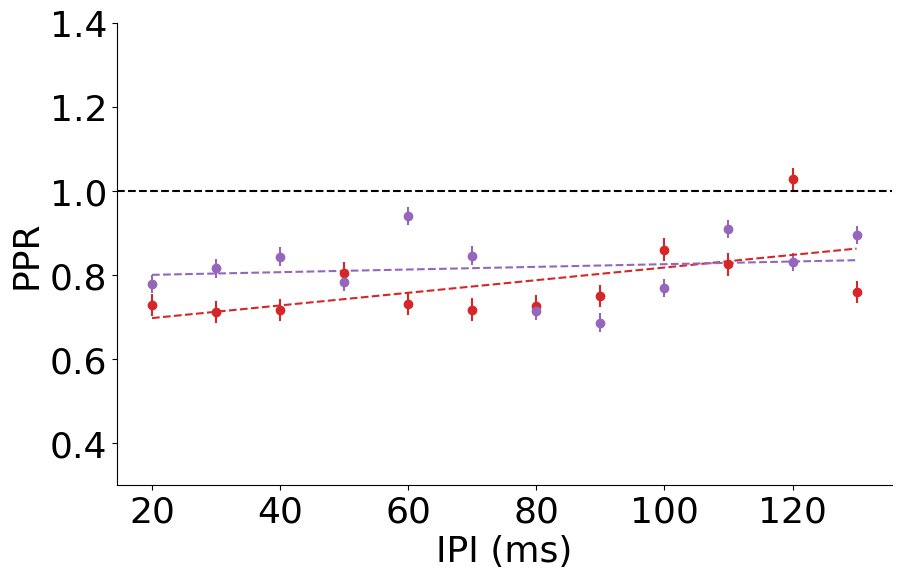

In [ ]:
# Group by Sex and then plot PPR versus IPI.

# Create a new figure for the plot
fig, ax = plt.subplots(figsize=(10, 6))
# Iterate through each unique Sex value
for i_sex, sex in enumerate(ppr_final_df['Sex'].unique()):
    # Filter the DataFrame for the current sex, and for Direction not None
    sex_ppr_df = ppr_final_df[(ppr_final_df['Sex'] == sex)]
    # Group by IPI and calculate the mean PPR for each IPI
    grouped_df = sex_ppr_df.groupby('IPI').mean()
    # Plot the mean PPR versus IPI for the current sex, with error bars
    ax.errorbar(grouped_df.index, grouped_df['PPR'], 
                yerr=grouped_df['PPR'].sem(),
                color='tab:red' if sex == 'M' else 'tab:purple',
                label = sex, fmt='o')

    # linear regression fit
    p0 = (0.1, 0.6)  # initial guess for slope and intercept
    popt, pcov = curve_fit(lambda x, a, b: a * x + b, 
                           grouped_df.index, 
                           grouped_df['PPR'], p0=p0, maxfev=10000)
    # plot the fit line
    x_fit = np.linspace(grouped_df.index.min(), grouped_df.index.max(), 100)
    y_fit = popt[0] * x_fit + popt[1]
    ax.plot(x_fit, y_fit, color='tab:red' if sex == 'M' else 'tab:purple', linestyle='--')
    # print the slope and intercept with uncertainty
    slope_uncertainty = np.sqrt(pcov[0][0])
    intercept_uncertainty = np.sqrt(pcov[1][1])
    print(f"Sex: {sex} | Slope: {popt[0]:.4f} ± {slope_uncertainty:.4f} | Intercept: {popt[1]:.4f} ± {intercept_uncertainty:.4f}")
    
    # print number of animals
    print(sex_ppr_df[['Date']].drop_duplicates())
    n_slices = sex_ppr_df[['Date']].drop_duplicates().shape[0]
    print(f"Sex: {sex} | n: {n_slices}")

#ax.legend()
ax.set_xlabel('IPI (ms)')
ax.set_ylabel('PPR')
ax.set_ylim(0.3, 1.4)

# dotted line at PPR = 1
ax.axhline(1, color='black', linestyle='--')

# remove spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# save the figure
plt.savefig(output_fig_dir + "sex_PPR_vs_IPI.png", dpi=300, bbox_inches='tight')
plt.show()

Age: 45 | Slope: 0.0007 ± 0.0006 | Intercept: 0.7538 ± 0.0495
Age: 45 | n: 9
Age: 60 | Slope: 0.0007 ± 0.0005 | Intercept: 0.6980 ± 0.0384
Age: 60 | n: 2
Age: 30 | Slope: 0.0029 ± 0.0020 | Intercept: 0.6745 ± 0.1627
Age: 30 | n: 1


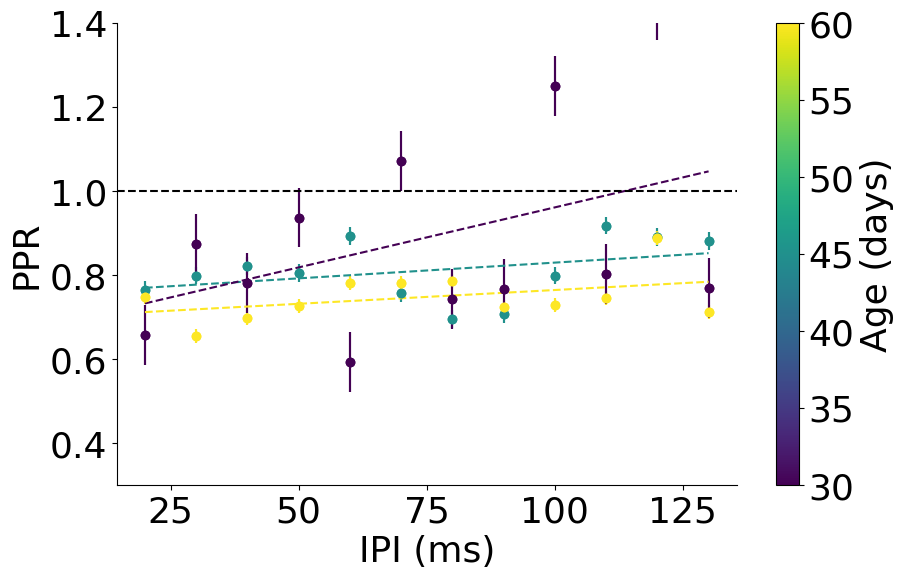

In [ ]:
# Group by Age and then plot PPR versus IPI.

# map ages to the nearest of 30, 45, or 60 days
def map_age_to_nearest(age):
    if age < 37.5:
        return 30
    elif 37.5 < age < 52.5:
        return 45
    elif age > 52.5:
        return 60
    else:
        return 60
# Apply the mapping function to the Age column
ppr_final_df['Age'] = ppr_final_df['Age'].apply(map_age_to_nearest)

# Create a new figure for the plot
fig, ax = plt.subplots(figsize=(10, 6))

# colorbar for age
# Normalize ages for colormap
ages = ppr_final_df['Age'].unique()
ages.sort()
norm = plt.Normalize(ages.min(), ages.max())
cmap = plt.cm.viridis

# Iterate through each unique Sex value
for i_age, age in enumerate(ppr_final_df['Age'].unique()):
    # Filter the DataFrame for the current sex
    age_ppr_df = ppr_final_df[ppr_final_df['Age'] == age]
    # Group by IPI and calculate the mean PPR for each IPI
    grouped_df = age_ppr_df.groupby('IPI').mean()
    # Plot the mean PPR versus IPI for the current sex, with error bars

    # Get color for this age
    color = cmap(norm(age))
    ax.errorbar(grouped_df.index, grouped_df['PPR'], 
                yerr=grouped_df['PPR'].sem(),
                color=color,
                fmt='o')


    ax.errorbar(grouped_df.index, grouped_df['PPR'], 
                yerr=grouped_df['PPR'].sem(),
                color=color,
                 fmt='o')

    # linear regression fit
    p0 = (0.1, 0.6)  # initial guess for slope and intercept
    popt, pcov = curve_fit(lambda x, a, b: a * x + b, 
                           grouped_df.index, 
                           grouped_df['PPR'], p0=p0, maxfev=10000)
    # plot the fit line
    x_fit = np.linspace(grouped_df.index.min(), grouped_df.index.max(), 100)
    y_fit = popt[0] * x_fit + popt[1]
    ax.plot(x_fit, y_fit, color=color, linestyle='--')
    # print the slope and intercept with uncertainty
    slope_uncertainty = np.sqrt(pcov[0][0])
    intercept_uncertainty = np.sqrt(pcov[1][1])
    print(f"Age: {age} | Slope: {popt[0]:.4f} ± {slope_uncertainty:.4f} | Intercept: {popt[1]:.4f} ± {intercept_uncertainty:.4f}")

    # print number of animals
    n_slices = age_ppr_df[['Date']].drop_duplicates().shape[0]
    print(f"Age: {age} | n: {n_slices}")


# Add colorbar to indicate age
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Age (days)')

#ax.legend()
ax.set_xlabel('IPI (ms)')
ax.set_ylabel('PPR')
ax.set_ylim(0.3, 1.4)

# dotted line at PPR = 1
ax.axhline(1, color='black', linestyle='--')

# remove spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# save the figure
plt.savefig(output_fig_dir + "age_PPR_vs_IPI.png", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# use ttest_ind_from_stats to see if PPR linear regression slopes/intercepts are significantly different
# in age groups or between sexes

'''Age: 45 | Slope: 0.0007 ± 0.0006 | Intercept: 0.7538 ± 0.0495
Age: 45 | n: 9
Age: 60 | Slope: 0.0007 ± 0.0005 | Intercept: 0.6980 ± 0.0384
Age: 60 | n: 2
Age: 30 | Slope: 0.0029 ± 0.0020 | Intercept: 0.6745 ± 0.1627
Age: 30 | n: 1'''

slope_means = {
    'M': 0.0015,
    'F': 0.0003,
    '30': 0.0029,
    '45': 0.0007,
    '60': 0.0007,
}
slope_stds = {
    'M': 0.0006,
    'F': 0.0007,
    '30': 0.0020,
    '45': 0.0006,
    '60': 0.0005,
}
intercept_means = {
    'M': 0.6667,
    'F': 0.7934,
    '30': 0.6745,
    '45': 0.7538,
    '60': 0.6980
}
intercept_stds = {
    'M': 0.0536,
    'F': 0.0547,
    '30': 0.1627,
    '45': 0.0495,
    '60': 0.0384
}

sample_sizes = {
    'M': 8,
    'F': 4,
    '30': 1,
    '45': 9,
    '60': 2
}


# calculate the t-statistic and p-value for each pair of slopes and intercepts
slope_tstat, slope_pval = ttest_ind_from_stats(slope_means['M'], slope_stds['M'], sample_sizes['M'], 
                                                slope_means['F'], slope_stds['F'], sample_sizes['F'],
                                                equal_var=False)
intercept_tstat, intercept_pval = ttest_ind_from_stats(intercept_means['M'], intercept_stds['M'], sample_sizes['M'], 
                                                        intercept_means['F'], intercept_stds['F'], sample_sizes['F'],
                                                        equal_var=False)
print(f"\nM vs F:")
print("Slope t-statistic =", round(slope_tstat, 2))
print("Slope p-value =", slope_pval)
print("Intercept t-statistic =", round(intercept_tstat, 2))
print("Intercept p-value =", intercept_pval)


# calculate the t-statistic and p-value for each pair of slopes and intercepts
ages = ['45', '60']
for i1 in range(len(ages)):
    age1 = ages[i1]
    for i2 in range(i1+1, len(ages)):
        age2 = ages[i2]
        if age1 == age2:
            continue
        slope_tstat, slope_pval = ttest_ind_from_stats(slope_means[age1], slope_stds[age1], sample_sizes[age1], 
                                                        slope_means[age2], slope_stds[age2], sample_sizes[age2],
                                                        equal_var=False)
        intercept_tstat, intercept_pval = ttest_ind_from_stats(intercept_means[age1], intercept_stds[age1], sample_sizes[age1], 
                                                                intercept_means[age2], intercept_stds[age2], sample_sizes[age2],
                                                                equal_var=False)
        print(f"\n{age1} vs {age2}:")
        print("Slope t-statistic =", round(slope_tstat, 2))
        print("Slope p-value =", slope_pval)
        print("Intercept t-statistic =", round(intercept_tstat, 2))
        print("Intercept p-value =", intercept_pval)



M vs F:
Slope t-statistic = 2.93
Slope p-value = 0.030341537691595647
Intercept t-statistic = -3.81
Intercept p-value = 0.00893911659477698

45 vs 60:
Slope t-statistic = 0.0
Slope p-value = 1.0
Intercept t-statistic = 1.76
Intercept p-value = 0.2316490621613208


## 